# Consideraciones  Iniciales

- Para la realización de este modelo, voy a utilizar distintas librerías, así como distintas funciones; algunas de estas funciones vienen de un documento python externo llamado Nuestras Funciones, usado en el modulo de minería de datos, el cual adjunto a este notebook para que se pueda ejecutar sin problemas.

- He realizado distintos notebooks según las estrategias que iba probando y combinando, sobre todo en el caso de imputación de missings, he probado diferentes métodos (random, mean, cadenas de markov y KNN), en este notebook verán el código correspondiente al método que ha arrojado mejores resultados, el de KNN. Sin embargo, con fines de demostrar el trabajo realizado, colocaré el código usado para las diferentes imputaciones pero lo colocaré comentado para que no afecte la ejecución del modelo.

- El proceso que he seguido de cara a la depuración, para quedarme con la mejor opción, ha sido la siguiente:

    - Opción 1: 
        - Usamos todas las variables. Sin gestionar outliers, ni valores raros, solo gestionamos missings (imputando valores missings por la MODA en categóricas y en las variables permit y public_meeting, los imputamos por False), pasamos a numéricas y modelamos con todas las opciones (Decision Tree, Random Forest, XGBoost, SVM). En esta opción no depuramos valores raros ni fuera de rango en numéricas, por lo que no tuvimos que imputar sino solo las categóricas 
        - Misma dinámica pero eliminando variables duplicadas. 
        - Misma dinámica pero eliminando variables duplicadas y variables que consideré no aportaban como (recorded_by)
     El mejor score en esta opción lo dio el Random Forest, con la eliminación de variables duplicadas y las que no aportaban. Variable eliminadas: ('scheme_name','extraction_type_group','management','payment','quality_group','quantity_group','source_type','waterpoint_type_group','wpt_name','recorded_by','subvillage','district_code’). **Score: 0.8131**
     
    - Opción 2:
        - Usamos todas las variables. Gestionamos solo valores raros, pasandolos a NaN, y posteriormente probamos imputando valores missings por la MODA(categóricas) + (i) random, (ii) cadenas de markov o (iii) knn, pasamos a numéricas y modelamos con todas las opciones (Decision Tree, Random Forest, XGBoost, SVM).
        - Misma dinámica pero eliminando variables duplicadas.
        - Misma dinámica pero eliminando variables duplicadas y variables que consideré no aportaban
     El mejor score en esta opción lo dio el Random Forest, con la eliminación de variables duplicadas y las que no aportaban. Variables eliminadas: 'scheme_name','extraction_type_group','management','payment','quality_group','quantity_group','source_type','waterpoint_type_group','wpt_name','recorded_by','subvillage','district_code','num_private'. **Score: 0.8130**
    - Opción 3: 
        - Usamos todas las variables. Gestionamos valores raros, pasandolos a NaN, gestionamos outliers pasándolos a missings, y posteriormente imputamos valores missing por la MODA (categóricas) + ((i)random, (ii) mean, (iii) knn, (iv)cadenas de markov), pasamos a numéricas y modelamos con todas las opciones (Decision Tree, Random Forest, XGBoost, SVM).
        - Misma dinámica pero eliminando variables duplicadas.
        - Misma dinámica pero eliminando variables duplicadas y variables que consideré no aportaban\
            **Ninguno de estos modelos mejoraron los scores anteriores.**
    - Opción 4: 
        - Misma opción anterior pero esta vez gestionamos outliers winsorizando, no generó mejora, así que fue descartado. 

Después de varias iteraciones el mejor modelo en este punto fue: Pasando valores fuera de rango (raros) a NaN, imputación por MODA a categóricas e imputación por KNN a numéricas. Eliminando variables: 'recorded_by','num_private','district_code','subvillage','waterpoint_type_group'. **Score: 0.8178**

In [1]:
import pandas as pd
import numpy as np

from datetime import datetime
import requests
import seaborn as sns
sns.set()
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

import re

# IQR/Z score.
from scipy.stats import stats

# Seleción de variables.
from sklearn.feature_selection import SelectKBest

# Modelos Selección.
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Modelos.
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeClassifierCV
from sklearn.svm import SVC
from sklearn.model_selection import RepeatedStratifiedKFold

# Preprocesado.
from sklearn.preprocessing import MinMaxScaler

from imblearn.over_sampling import SMOTE
import pickle
# Métricas.
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve, classification_report

import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer

# Moda: Solo nominales
imputer_moda = skl_imp.SimpleImputer(strategy='most_frequent', missing_values=np.nan)

# knn: Solo numéricas
imputer_knn = skl_imp.KNNImputer(n_neighbors=3)

# Chain equations: solo numéricas
imputer_itImp = skl_imp.IterativeImputer(max_iter=10, random_state=0)

import feature_engine.imputation as fe_imp

# Aleatoria: numéricas y nominales
imputer_rand = fe_imp.RandomSampleImputer()

# Mediana: solo numéricas
imputer_median = fe_imp.MeanMedianImputer(imputation_method='median')

# Media: solo numericas
imputer_mean = fe_imp.MeanMedianImputer(imputation_method='mean')

In [2]:
#importamos archivo NuestrasFunciones y csv x_train de la competencia
execfile('/Users/andreac.henechesierra/Desktop/Master_Data_Science/Mineria_de_datos_y_modelizacion_predictiva/NuestrasFunciones.py')

x_train = pd.read_csv('/Users/andreac.henechesierra/Desktop/Master_Data_Science/Machine_learning_III/Tarea/X_train.csv')
x_train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [3]:
#importamos el csv y_train de la competencia
y = pd.read_csv('/Users/andreac.henechesierra/Desktop/Master_Data_Science/Machine_learning_III/Tarea/Y_train.csv')
y.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [4]:
#importamos el csv X_test de la competencia, es decir, el dataset cuya variable objetivo buscamos predecir
X_test = pd.read_csv('/Users/andreac.henechesierra/Desktop/Master_Data_Science/Machine_learning_III/Tarea/X_test.csv')
X_test.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,...,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,...,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [5]:
#analizamos el tamaño de cada dataset
print('Tamaño de tabla de x_train:',x_train.shape[0])
print('Tamaño de tabla de y:',y.shape[0])
print('Tamaño de tabla de x_test:',X_test.shape[0])

Tamaño de tabla de x_train: 59400
Tamaño de tabla de y: 59400
Tamaño de tabla de x_test: 14850


In [6]:
# Evaluamos cuantos valores únicos hay 
print('x_train: ',len(x_train['id'].unique()))
print('x_test: ',len(X_test['id'].unique()))

x_train:  59400
x_test:  14850


In [7]:
#revisamos si hay algún id que se repita en x_test con respecto a x_train
#y cuantos ids hay en comun entre y_train y x_train
print('Ids en tabla x_test\n', X_test['id'].isin(x_train['id']).value_counts())
print('Ids en tabla y\n',y['id'].isin(x_train['id']).value_counts())

Ids en tabla x_test
 False    14850
Name: id, dtype: int64
Ids en tabla y
 True    59400
Name: id, dtype: int64


### Decisión sobre datasets:

Tomo la decisión de unir la X_train con la X_test para realizar de forma uniforme y a la vez, el procesado de los datos. Gestión de valores raros, gestión de outliers, gestión de missings y transformaciones de las variables categóricas. Para diferenciar y poder separar ambos datasets más adelante, agrego una columna adicional llamada "data" a cada dataset donde identifico si es de train o de test.

In [8]:
#agregamos etiquetas para diferenciar valores de x_train con x_test
x_train["data"] = "train"
X_test["data"] = "test"

In [9]:
x_train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,data
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,train
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,train
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,train
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,train
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,train


In [10]:
X_test.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,data
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other,test
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,...,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe,test
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other,test
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,...,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other,test
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,test


In [11]:
#concatenamos los datos del dataset x_test con los de x_train
bombas = pd.concat([x_train, X_test], axis=0)

In [12]:
bombas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 0 to 14849
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     74250 non-null  int64  
 1   amount_tsh             74250 non-null  float64
 2   date_recorded          74250 non-null  object 
 3   funder                 69746 non-null  object 
 4   gps_height             74250 non-null  int64  
 5   installer              69718 non-null  object 
 6   longitude              74250 non-null  float64
 7   latitude               74250 non-null  float64
 8   wpt_name               74250 non-null  object 
 9   num_private            74250 non-null  int64  
 10  basin                  74250 non-null  object 
 11  subvillage             73780 non-null  object 
 12  region                 74250 non-null  object 
 13  region_code            74250 non-null  int64  
 14  district_code          74250 non-null  int64  
 15  lg

In [13]:
y.status_group.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

In [14]:
bombas.shape

(74250, 41)

In [15]:
#dividimos variables numéricas de las no numéricas
cat_cols= bombas.select_dtypes(include=['object','category']).columns
num_cols = bombas.select_dtypes(exclude=['object','category']).columns

In [16]:
bombas.isnull().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    4504
gps_height                   0
installer                 4532
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 470
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            4155
recorded_by                  0
scheme_management         4846
scheme_name              35258
permit                    3793
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [17]:
#Usamos la función pandas_profiling para generar un reporte rápido sobre las variables y usarlo en mi EDA
import pandas_profiling
pandas_profiling.ProfileReport(bombas)

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2654696373.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Observaciones inciales:

- Hay muchas variables con alto porcentaje de missings (funder,installer,scheme_management,scheme_name,permit)

- Hay varias variables con un alto porcentaje de ceros (amount_tsh, gps_height,longitude,num_private,population,construction_year), probaremos pasando a missings y dejando como están ya que quizás los 0 caractericen algo importante en alguna de esas variables que ayude al modelo a distinguir

- Hay muchas variables que parecen ser lo mismo, probaremos quedarnos solo con una, y probaremos si mantener las que representan lo mismo aporta o no al modelo, he notado que estas variables tienen a veces con distintas categorías pero lo mismo al fin. Son las siguientes: 
    - scheme_management - Who operates the waterpoint
    - scheme_name - Who operates the waterpoint
    - extraction_type - The kind of extraction the waterpoint uses
    - extraction_type_group - The kind of extraction the waterpoint uses
    - extraction_type_class - The kind of extraction the waterpoint uses
    - management - How the waterpoint is managed
    - management_group - How the waterpoint is managed
    - payment - What the water costs
    - payment_type - What the water costs
    - water_quality - The quality of the water
    - quality_group - The quality of the water
    - quantity - The quantity of water
    - quantity_group - The quantity of water
    - source - The source of the water
    - source_type - The source of the water
    - source_class - The source of the water
    - waterpoint_type - The kind of waterpoint
    - waterpoint_type_group - The kind of waterpoint
    
- Hay variables categóricas con muchas clases diferentes (alta cardinalidad), como por ejemplo (funder,installer,wpt_name,subvillage,ward,scheme_name), aquí probaremos agrupando clases minoritarias o reemplazando las variables por su frecuencia, nos quedaremos con el método que mejor funcione.

- Probaremos eliminar variables que consideremos que no aportan al modelo, y probaremos si mantenerlas ayuda o desmejora el modelo. Variable que a priori parecen no ser relevantes:

    - wpt_name: nombre del waterpoint
    - recorded_by: grupo que recopiló la data, hay un solo valor para todos los registros por lo que no aporta nada
    - subvillage: tiene muchos valores y ya tenemos región para localización geográfica, no sería redundante?
    - region_code: no aporta nada ya que tenemos la variable region, y adicionalmente he verificado que hay regiones que tienen más de un código de región diferente asignado, lo cual no es correcto
    - district_code: no parece aportar nada, indica que una misma región puede tener distintos codigos de distrito y a la vez que un mismo codigo de distrito puede estar asociado a distintas regiones. Hay incongruencia. 

- Hemos verificado que los valores en las variables quantity y quantity_group son los mismos

- En water_quality (salty + salty abandoned = salty en quality_group), (soft=good) y (fluoride + fluoride abandoned = fluoride en quality_group).

- En extraction_type (other - rope pump = rope pump en extraction_type_group), (windmill = wind-powered en extraction_type_group), (other - swn 81 = other handpump en extraction_type_group), (other - mkulima/shinyanga = other handpump en extraction_type_group), (climax = other handpump en extraction_type_group), (walimi = other handpump en extraction_type_group), (other - play pump = other handpump en extraction_type_group), (cemo = other motorpump en extraction_type_group), (ksb = submersible en extraction_type_group).

- En payment (pay per bucket = per bucket en payment_type), (pay monthly = monthly en payment_type), (pay when scheme fails = on failure en payment_type), (pay annually = annually en payment_type).

- En source (machine dbh = borehole en source_type), (river=river/lake en source_type), (hand dtw = borehole en source_type), (lake=river/lake en source_type), (unknown = other en source_type).

- En waterpoint_type (communal standpipe multiple = communal standpipe en waterpoint_type_group). 

- Variable categóricas binarias: public_meeting, permit.

- Variable wpt_name -> contiene valores "none", representa los nombres del waterpoint y puede no ser relevante, veremos

- Varible recorded_by un solo valor único, no aporta valor al modelo

- Variable date_recorded, 356 valores único, quizás convenga transformar clases a meses para reducir categorías o usarla para definir la antiguedad del waterpoint junto con construction_year

- Hay regiones que tienen más de un region_code asignado, lo cual no debería ser. Son (Arusha:2,Lindi:3,Mtwara:3,Mwanza:2,Pwani:3,Shinyanga:3,Tanga:2).

- Variable "district_code" deberia ser categórica, no parece aportar nada, indica que una misma región puede tener distintos codigos de distrito y a la vez que un mismo codigo de distrito puede estar asociado a distintas regiones. Hay incongruencia. Me planteo eliminarla

In [18]:
#agregar codigo usado para evaluar las diferentes variables. Esto está en el archivo de depuracion

# Tratamiento de valores raros y fuera de rango

Procedemos a tratar los valores fuera de rango que no hacen sentido, dichos valores los pasaremos a missings para su posterior imputación. 

**Nota importante: Se han probado varios escenarios con la data, por cada variable gestionada se ha comparado si para el modelo juega mejor dejar la data como está vs pasar valores raros o fuera de rango a missing, y a continuación, se ha dejado la opción que mejor se ha comportado con respecto al modelo y su capacidad predictiva. De lo contrario, lo que hemos probado pero no ha funcionado, lo hemos dejado comentado y es importante no ejecutarlo ya que alteraría los resultados**

In [19]:
bombas.amount_tsh.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: amount_tsh
Non-Null Count  Dtype  
--------------  -----  
74250 non-null  float64
dtypes: float64(1)
memory usage: 3.1 MB


In [20]:
#pasamos 0's a missings
bombas.amount_tsh.replace(0,np.nan,inplace=True)

In [21]:
bombas.amount_tsh.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: amount_tsh
Non-Null Count  Dtype  
--------------  -----  
22201 non-null  float64
dtypes: float64(1)
memory usage: 3.1 MB


In [22]:
#bombas.gps_height.info()

In [23]:
#Dejo comentado este código porque probé pasando los valores menores o iguales a 0 a NaN y el modelo dio peor resultado
#es por ello que he decidido no tocar estos valores en la variable gps_height

#pasamos todos los valores menores o iguales a 0 a NaN
#bombas['gps_height'] = np.where((bombas['gps_height'] <= 0),np.nan,bombas.gps_height)

In [24]:
#bombas.gps_height.info()

In [25]:
bombas.longitude.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: longitude
Non-Null Count  Dtype  
--------------  -----  
74250 non-null  float64
dtypes: float64(1)
memory usage: 3.1 MB


In [26]:
#pasamos 0's a missings
bombas.longitude.replace(0,np.nan,inplace=True)

In [27]:
bombas.longitude.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: longitude
Non-Null Count  Dtype  
--------------  -----  
71981 non-null  float64
dtypes: float64(1)
memory usage: 3.1 MB


In [28]:
bombas.population.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: population
Non-Null Count  Dtype
--------------  -----
74250 non-null  int64
dtypes: int64(1)
memory usage: 3.1 MB


In [29]:
#pasamos 0's y 1's a missing
bombas['population'] = np.where((bombas['population'] <= 1),np.nan,bombas.population)

In [30]:
bombas.population.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: population
Non-Null Count  Dtype  
--------------  -----  
38634 non-null  float64
dtypes: float64(1)
memory usage: 3.1 MB


In [31]:
#bombas.construction_year.info()

In [32]:
#Dejo comentado este código porque probé pasando los 0's a missing y el modelo dio peor resultado
#es por ello que he decidido no tocar estos valores en la variable construction_year

#pasamos 0's a missings
#bombas.construction_year.replace(0,np.nan,inplace=True)

In [33]:
#bombas.construction_year.info()

In [34]:
bombas.funder.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: funder
Non-Null Count  Dtype 
--------------  ----- 
69746 non-null  object
dtypes: object(1)
memory usage: 3.1+ MB


In [35]:
#pasamos 0's a missings
bombas.funder.replace('0',np.nan,inplace=True)

In [36]:
bombas.funder.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: funder
Non-Null Count  Dtype 
--------------  ----- 
68766 non-null  object
dtypes: object(1)
memory usage: 3.1+ MB


In [37]:
bombas.funder.value_counts().sort_index()

A/co Germany                   19
Aar                            41
Abas Ka                         1
Abasia                         51
Abc-ihushi Development Cent     1
                               ..
Zao Water Spring                4
Zao Water Spring X              1
Zara Camp                       1
Zinduka                         1
Zingibali Secondary             1
Name: funder, Length: 2139, dtype: int64

In [38]:
bombas.installer.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: installer
Non-Null Count  Dtype 
--------------  ----- 
69718 non-null  object
dtypes: object(1)
memory usage: 3.1+ MB


In [39]:
#pasamos 0's a missings
bombas.installer.replace('0',np.nan,inplace=True)
bombas.installer.replace('-',np.nan,inplace=True)

In [40]:
bombas.installer.value_counts().sort_index()

A.D.B              1
AAR                5
ABASIA            34
ABD                1
ABDALA             1
                  ..
water board        3
wizara ya maji     3
world              5
world banks        1
world vision       1
Name: installer, Length: 2408, dtype: int64

In [41]:
bombas.installer.info()

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: installer
Non-Null Count  Dtype 
--------------  ----- 
68735 non-null  object
dtypes: object(1)
memory usage: 3.1+ MB


## Comentarios sobre gestión de valores fuera de rango o raros:

- amount_tsh: esta variable tenía un alto porcentaje de ceros, y representa la cantidad de agua disponible para el punto de agua, no hacía sentido estos ceros, por lo que hemos probado dos estrategias: (i) dejar los ceros y no tocar nada, (ii) pasar los ceros a missings e imputar su valor posteriormente. He probado ambas opciones y la opción ii es la que ha generado mejores resultados, es por ello que es la que hemos dejado en este modelo.


- gps_height: esta variable tiene alto porcentaje de ceros e incluso contiene valores negativos, y representa la altitud del pozo, con lo cual inicialmente consideramos pasar a missings todos los valores iguales o menores a 0. Sin embargo, hemos investigado y la altitud negativa es posible y significa que está bajo el nivel del mar, con lo cual podría tratarse de un waterpoint subterráneo, al mismo tiempo una altitud de 0 indica que se está al nivel del mar. Hemos probado las siguientes estrategias: (i) pasar a missings valores iguales o menores a cero y luego imputar valores, (ii) dejar la variable como estaba. En este caso nos hemos quedado con la segunda opción que fue la que funcionó mejor de cara al modelo


- longitude: hemos comprobado que no es correcto que esta variable contenga 0's razón por la cual hemos pasado a missing estos valores para su posterior imputación.


- population: representa la población alrededor del pozo, con lo cual no hace sentido mucho sentido los valores de 0 y 1, en este sentido, hemos pasado estos valores a missing para su posterior imputación.


- construction_year: representa el año en el que se construyó el pozo, a pesar de que claramente el 0 no es un valor correcto para esta variable, hemos probado dos estrategias: (i) dejar los valores como están, (ii) pasar a missings todos los ceros y posteriormente imputar sus valores. En este caso hemos comprobado que la opción que mejor funcionó para el modelo fue la primera, y muy probablemente se deba a que los pozos cuyo año de construcción es 0 representan un conjunto de pozos de los cuales no se sabe su fecha de creación y por tanto es una característica que sirve al modelo para predecir el estado de la bomba.


- funder: reemplazamos los ceros por missings para su posterior imputación ya que no es un valor válido.


- installer: reemplazamos los ceros y valores de caracteres extraños como "-" por missings para su posterior imputación, ya que no son valores válidos.

## Outliers

de NuestrasFunciones utilizamos la función gestiona_outliers() que puede ser invocada con tres argumentos diferentes: 
 - Para revisar incidencia en porcentaje, es decir, saber qué porcentaje de cada variable son outliers
 - Para winsorizar outliers
 - Para pasarlos a missings

In [42]:
#verificamos la simetría de la distribución de las variables
bombas.select_dtypes(include=np.number).apply(lambda x: x.skew())

id                   1.025784e-18
amount_tsh           3.174562e+01
gps_height           4.692944e-01
longitude           -1.344640e-01
latitude            -1.528808e-01
num_private          9.132698e+01
region_code          3.179454e+00
district_code        3.961433e+00
population           9.750981e+00
construction_year   -6.297841e-01
dtype: float64

In [43]:
# chequeamos incidencia de outliers en porcentaje
bombas.select_dtypes(include=np.number).copy().apply(lambda x: gestiona_outliers(x))

id
amount_tsh
gps_height
longitude
latitude
num_private
region_code
district_code
population
construction_year


/Users/andreac.henechesierra/Desktop/Master_Data_Science/Mineria_de_datos_y_modelizacion_predictiva/NuestrasFunciones.py:105: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  criterio1 = abs((col-col.median())/col.mad())>8
/Users/andreac.henechesierra/Desktop/Master_Data_Science/Mineria_de_datos_y_modelizacion_predictiva/NuestrasFunciones.py:105: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  criterio1 = abs((col-col.median())/col.mad())>8
/Users/andreac.henechesierra/Desktop/Master_Data_Science/Mineria_de_datos_y_modelizacion_predictiva/NuestrasFunciones.py:105: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  criterio1 = abs((col-col.median())/col.mad(

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0
1,0.0,1.035989,0.0,0.0,0.0,0.774411,2.215488,2.777104,1.364083,0.0
2,0.0,1.035989,0.0,0.0,0.0,0.774411,2.215488,2.777104,1.364083,0.0


### Decisión sobre outliers:

Tras la realización de diferentes procesos donde exploramos estas tres opciones: (i) winsorizamos los outliers, (ii) pasamos a missings los outliers y después imputamos valores; y (iii) dejamos sin alterar los outliers. El proceso que mejor resultó para el modelo fue dejar estos datos sin alterar, de igual forma es importante destacar que la incidencia de outliers no es muy alta, siendo como máximo un 3% de los valores de la respectiva variable.

Dejamos a continuación comentado el código utilizado para el tratamiento de pasar outliers a missings y para winsorizar outliers. Con el fin de demostrar el código utilizado para el proceso

In [44]:
# Creamos copia para evitar pisar información
#bombasCont = bombas.select_dtypes(include=np.number).copy()

#Aplicamos la gestión de outliers en modelo missing
#bombas_miss = bombasCont.apply(lambda x: gestiona_outliers(x,clas='miss'))

#Aplicamos la gestión de outliers en modelo missing
#bombas_win = bombasCont.apply(lambda x: gestiona_outliers(x,clas='winsor'))

##  Tratamiento de nulos

Procedemos al tratamiento de valores nulos donde, de acuerdo a lo explicado anteriormente, hemos iterado entre varios métodos de imputación tanto para variables categóricas como para las variables numéricas. El código comentado a continuación representa las opciones probadas que no han funcionado y hemos dejado en código ejecutable la opción que mejor ha servido al modelo.

In [45]:
bombas.isnull().sum()

id                           0
amount_tsh               52049
date_recorded                0
funder                    5484
gps_height                   0
installer                 5515
longitude                 2269
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 470
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population               35616
public_meeting            4155
recorded_by                  0
scheme_management         4846
scheme_name              35258
permit                    3793
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

# Imputaciones:

Hay variables donde estaremos imputando un porcentaje muy alto de los registros, estas variables son:

- amount_tsh
- funder
- installer
- population
- scheme_name

## Imputamos categóricas por la MODA

Para las categóricas hemos probado con dos estrategias de imputación: (i) imputación random (ii) imputación por la moda, hemos comprobado que imputar por la moda arrojó mejores resultados, es por ello que he procedido con esta segunda opción.

In [46]:
#reemplazamos los missings por False en la variable public meeting
bombas.public_meeting.replace(np.nan,False,inplace=True)

In [47]:
bombas.public_meeting.value_counts()

True     63749
False    10501
Name: public_meeting, dtype: int64

In [48]:
#reemplazamos los missings por False en permit
bombas.permit.replace(np.nan,False,inplace=True)

In [49]:
bombas.permit.value_counts()

True     48606
False    25644
Name: permit, dtype: int64

In [50]:
#imputamos missings de funder por la MODA: Government Of Tanzania
bombas.funder.replace(np.nan,'Government Of Tanzania',inplace=True)

In [51]:
#imputamos missings de installer por la MODA: DWE
bombas.installer.replace(np.nan,'DWE',inplace=True)

In [52]:
#imputamos missings de subvillage por la MODA: Madukani
bombas.subvillage.replace(np.nan,'Shuleni',inplace=True)

In [53]:
#imputamos missings de scheme_management por la MODA: VWC
bombas.scheme_management.replace(np.nan,'VWC',inplace=True)

In [54]:
#imputamos missings scheme_name por 'unknown' ya que son demasiados
bombas.scheme_name.replace(np.nan,'unknown',inplace=True)

In [55]:
bombas.dtypes

id                         int64
amount_tsh               float64
date_recorded             object
funder                    object
gps_height                 int64
installer                 object
longitude                float64
latitude                 float64
wpt_name                  object
num_private                int64
basin                     object
subvillage                object
region                    object
region_code                int64
district_code              int64
lga                       object
ward                      object
population               float64
public_meeting              bool
recorded_by               object
scheme_management         object
scheme_name               object
permit                      bool
construction_year          int64
extraction_type           object
extraction_type_group     object
extraction_type_class     object
management                object
management_group          object
payment                   object
payment_ty

## Imputamos numéricas por KNN

Para las variables numéricas hemos probado con tres estrategias de imputación: (i) imputación random, (ii) imputación por cadenas de Markov y (iii) imputación por KNN, hemos comprobado que imputar por KNN arrojó los mejores resultados de cara al modelo y su capacidad predictiva, es por ello que he procedido con esta tercera opción.

La forma de proceder fue la siguiente:

- Separamos las variables numéricas en un dataframe aparte "bombas_num", ya que al método de imputación KNN solo pueden pasársele valores numéricos
- Reseteamos el index para que no de error
- Separamos las variables categóricas para posteriormente poder concatenarlas a las numéricas ya imputadas y reseteamos su index para que no de error
- Imputamos valores de missings en variables numéricas por KNN
- Creamos dataframe con numéricas imputadas y categóricas

Es importante destacar que imputar por KNN requiere de un mayor esfuerzo computacional por lo que tarda un poco.

In [56]:
#creamos dataframe con variables numéricas y reseteamos index
#para poder imputar los valores de las variables numéricas por separado de las categóricas
#posteriormente uniremos las variables categóricas con las numéricas nuevamente
bombas_num = bombas[num_cols]
bombas_num = bombas_num.reset_index(drop=True)
bombas_num

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
0,69572,6000.0,1390,34.938093,-9.856322,0,11,5,109.0,1999
1,8776,NaN,1399,34.698766,-2.147466,0,20,2,280.0,2010
2,34310,25.0,686,37.460664,-3.821329,0,21,4,250.0,2009
3,67743,NaN,263,38.486161,-11.155298,0,90,63,58.0,1986
4,19728,NaN,0,31.130847,-1.825359,0,18,1,NaN,0
...,...,...,...,...,...,...,...,...,...,...
74245,39307,NaN,34,38.852669,-6.582841,0,6,1,20.0,1988
74246,18990,1000.0,0,37.451633,-5.350428,0,4,7,2960.0,1994
74247,28749,NaN,1476,34.739804,-4.585587,0,13,2,200.0,2010
74248,33492,NaN,998,35.432732,-10.584159,0,10,2,150.0,2009


In [57]:
#creamos dataframe con variables categóricas y reseteamos index
bombas_cat = bombas[cat_cols]
bombas_cat = bombas_cat.reset_index(drop=True)
bombas_cat

,date_recorded,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,data
0,2011-03-14,Roman,Roman,none,Lake Nyasa,Mnyusi B,Iringa,Ludewa,Mundindi,True,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,train
1,2013-03-06,Grumeti,GRUMETI,Zahanati,Lake Victoria,Nyamara,Mara,Serengeti,Natta,False,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,train
2,2013-02-25,Lottery Club,World vision,Kwa Mahundi,Pangani,Majengo,Manyara,Simanjiro,Ngorika,True,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,train
3,2013-01-28,Unicef,UNICEF,Zahanati Ya Nanyumbu,Ruvuma / Southern Coast,Mahakamani,Mtwara,Nanyumbu,Nanyumbu,True,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,train
4,2011-07-13,Action In A,Artisan,Shuleni,Lake Victoria,Kyanyamisa,Kagera,Karagwe,Nyakasimbi,True,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74245,2011-02-24,Danida,Da,Kwambwezi,Wami / Ruvu,Yombo,Pwani,Bagamoyo,Yombo,True,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,test
74246,2011-03-21,Hiap,HIAP,Bonde La Mkondoa,Pangani,Mkondoa,Tanga,Kilindi,Mvungwe,True,...,salty,salty,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,test
74247,2013-03-04,Government Of Tanzania,DWE,Bwawani,Internal,Juhudi,Singida,Singida Rural,Ughandi,True,...,soft,good,insufficient,insufficient,dam,dam,surface,communal standpipe,communal standpipe,test
74248,2013-02-18,Germany,DWE,Kwa John,Lake Nyasa,Namakinga B,Ruvuma,Songea Rural,Maposeni,True,...,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,test


In [58]:
#imputamos por KNN las variables numéricas
bombas_knn = pd.DataFrame(imputer_knn.fit_transform(bombas_num),columns=bombas_num.columns)
bombas_knn

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
0,69572.0,6000.000000,1390.0,34.938093,-9.856322,0.0,11.0,5.0,109.000000,1999.0
1,8776.0,400.000000,1399.0,34.698766,-2.147466,0.0,20.0,2.0,280.000000,2010.0
2,34310.0,25.000000,686.0,37.460664,-3.821329,0.0,21.0,4.0,250.000000,2009.0
3,67743.0,310.000000,263.0,38.486161,-11.155298,0.0,90.0,63.0,58.000000,1986.0
4,19728.0,2003.333333,0.0,31.130847,-1.825359,0.0,18.0,1.0,195.333333,0.0
...,...,...,...,...,...,...,...,...,...,...
74245,39307.0,33.333333,34.0,38.852669,-6.582841,0.0,6.0,1.0,20.000000,1988.0
74246,18990.0,1000.000000,0.0,37.451633,-5.350428,0.0,4.0,7.0,2960.000000,1994.0
74247,28749.0,350.000000,1476.0,34.739804,-4.585587,0.0,13.0,2.0,200.000000,2010.0
74248,33492.0,91.666667,998.0,35.432732,-10.584159,0.0,10.0,2.0,150.000000,2009.0


In [59]:
bombas_knn.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,74250.000000,74250.000000,74250.000000,74250.000000,7.425000e+04,74250.000000,74250.000000,74250.000000,74250.000000,74250.000000
mean,37124.500000,1658.021281,665.667313,35.073762,-5.701771e+00,0.462330,15.265414,5.629077,370.256593,1298.463650
std,21434.273081,6081.665469,692.761033,2.604875,2.944969e+00,11.537879,17.508907,9.641636,547.894608,952.349375
min,0.000000,0.200000,-90.000000,29.607122,-1.164944e+01,0.000000,1.000000,0.000000,2.000000,0.000000
25%,18562.250000,50.000000,0.000000,33.144669,-8.525675e+00,0.000000,5.000000,2.000000,126.000000,0.000000
50%,37124.500000,363.333333,364.000000,34.907475,-5.026540e+00,0.000000,12.000000,3.000000,238.000000,1986.000000
75%,55686.750000,1500.000000,1317.000000,37.181685,-3.325058e+00,0.000000,17.000000,5.000000,400.000000,2004.000000
max,74249.000000,350000.000000,2777.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [60]:
#concat con categoricas y numéricas imputadas para nuestro dataset final depurado
bombas_knn_moda = pd.concat([bombas_knn,bombas_cat], axis=1)
bombas_knn_moda

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,data
0,69572.0,6000.000000,1390.0,34.938093,-9.856322,0.0,11.0,5.0,109.000000,1999.0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,train
1,8776.0,400.000000,1399.0,34.698766,-2.147466,0.0,20.0,2.0,280.000000,2010.0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,train
2,34310.0,25.000000,686.0,37.460664,-3.821329,0.0,21.0,4.0,250.000000,2009.0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,train
3,67743.0,310.000000,263.0,38.486161,-11.155298,0.0,90.0,63.0,58.000000,1986.0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,train
4,19728.0,2003.333333,0.0,31.130847,-1.825359,0.0,18.0,1.0,195.333333,0.0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74245,39307.0,33.333333,34.0,38.852669,-6.582841,0.0,6.0,1.0,20.000000,1988.0,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,test
74246,18990.0,1000.000000,0.0,37.451633,-5.350428,0.0,4.0,7.0,2960.000000,1994.0,...,salty,salty,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,test
74247,28749.0,350.000000,1476.0,34.739804,-4.585587,0.0,13.0,2.0,200.000000,2010.0,...,soft,good,insufficient,insufficient,dam,dam,surface,communal standpipe,communal standpipe,test
74248,33492.0,91.666667,998.0,35.432732,-10.584159,0.0,10.0,2.0,150.000000,2009.0,...,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,test


In [61]:
bombas_knn_moda.isnull().sum()

id                       0
amount_tsh               0
gps_height               0
longitude                0
latitude                 0
num_private              0
region_code              0
district_code            0
population               0
construction_year        0
date_recorded            0
funder                   0
installer                0
wpt_name                 0
basin                    0
subvillage               0
region                   0
lga                      0
ward                     0
public_meeting           0
recorded_by              0
scheme_management        0
scheme_name              0
permit                   0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
s

In [62]:
#Otros métodos de imputación probados:

#Imputación por Mean
#bombas_mean = imputer_mean.fit(bombas).transform(bombas)
#bombas_mean.describe()

#Imputación Random
#bombas_rand = imputer_rand.fit(bombas).transform(bombas)
#bombas_rand.describe()

#Imputación por cadenas 
#bombas_chain = pd.DataFrame(imputer_itImp.fit_transform(bombas_num),columns=bombas_num.columns)
#bombas_chain.describe()

# Transformación de variables categóricas a numéricas

Una vez imputados los valores nulos tanto para numéricas como para categóricas, procedemos a realizar las tranasformaciones necesarias, cuyo resultado final debe ser todas las variables transformadas a valores numéricos para poder utilizarlas en nuestros modelos. 

In [63]:
#verificamos tipos de cada variables
bombas_knn_moda.dtypes

id                       float64
amount_tsh               float64
gps_height               float64
longitude                float64
latitude                 float64
num_private              float64
region_code              float64
district_code            float64
population               float64
construction_year        float64
date_recorded             object
funder                    object
installer                 object
wpt_name                  object
basin                     object
subvillage                object
region                    object
lga                       object
ward                      object
public_meeting              bool
recorded_by               object
scheme_management         object
scheme_name               object
permit                      bool
extraction_type           object
extraction_type_group     object
extraction_type_class     object
management                object
management_group          object
payment                   object
payment_ty

### Variables binarias

Tenemos dos variables categóricas binarias: "public_meeting" y "permit". Pasamos a numéricas manualmente considerando con 0 y 1. 0 serán las False y 1 las True.

In [64]:
#variables que serán binarias 0 y 1
variables_binarias = ['public_meeting','permit']

In [65]:
bombas_knn_moda.public_meeting.value_counts()

True     63749
False    10501
Name: public_meeting, dtype: int64

In [66]:
bombas_knn_moda.permit.value_counts()

True     48606
False    25644
Name: permit, dtype: int64

In [67]:
#para las variables binarias reemplazamos los valores True por 1 y False por 0
for j in variables_binarias:
    bombas_knn_moda[j].replace(True,1,inplace=True)
    bombas_knn_moda[j].replace(False,0,inplace=True)

In [68]:
bombas_knn_moda.public_meeting.value_counts()

1    63749
0    10501
Name: public_meeting, dtype: int64

In [69]:
bombas_knn_moda.permit.value_counts()

1    48606
0    25644
Name: permit, dtype: int64

In [70]:
bombas_knn_moda.recorded_by.value_counts()

GeoData Consultants Ltd    74250
Name: recorded_by, dtype: int64

In [71]:
#pasamos recorder_by a numérica, tiene un solo valor razón por la cual lo pasamos a 1
bombas_knn_moda.recorded_by.replace('GeoData Consultants Ltd',1,inplace=True)
bombas_knn_moda.recorded_by.value_counts()

1    74250
Name: recorded_by, dtype: int64

Para tratar el resto de variables categóricas, después de probar varias opciones (transformación a numéricas con label enconder, sustituir por la frecuencia de la clase dentro de la categoría y agrupación de las categorías con menor representación, hemos decidido aplicar un método diferente dependiento de la variable y sus características.


## Agrupamos categorías con representación menor al 5%

Las variables funder, installer, wpt_name y scheme name, son variables con muchos valores/clases diferentes (alta cardinalidad) y tienen la característica de que la mayoría de dichas clases tienen muy poca representación o frecuencia dentro de la variable, es por ello que he decidido utilizar para ellas el método de agrupación de categorías con representación menor al 5%. En este sentido, se dejaran en un principio aquellas clases con una representación mayor al 5% y el resto serán agrupadas en una categoría llamada "rare", para que posteriormente, una vez disminuido el número de clases diferentes dentro de la variables, podamos transformar a numéricas con label encoder. 

In [72]:
#funder
freqs_fund = bombas_knn_moda['funder'].value_counts(normalize=True)
    
frequent_cat_fund = [x for x in freqs_fund.loc[freqs_fund > 0.05].index.values]
print(f'Funder: {frequent_cat_fund}')

bombas_knn_moda['funder'] = np.where(
    bombas_knn_moda['funder'].isin(frequent_cat_fund),
    bombas_knn_moda['funder'], "rare")

bombas_knn_moda['funder'].value_counts(normalize=True)

#installer
freqs_inst = bombas_knn_moda['installer'].value_counts(normalize=True)
    
frequent_cat_inst = [x for x in freqs_inst.loc[freqs_inst > 0.05].index.values]
print(f'Installer: {frequent_cat_inst}')

bombas_knn_moda['installer'] = np.where(
    bombas_knn_moda['installer'].isin(frequent_cat_inst),
    bombas_knn_moda['installer'], "rare")

bombas_knn_moda['installer'].value_counts(normalize=True)

#wpt_name
freqs_name = bombas_knn_moda['wpt_name'].value_counts(normalize=True)
    
frequent_cat_name = [x for x in freqs_name.loc[freqs_name > 0.05].index.values]
print(f'wpt_name: {frequent_cat_name}')

bombas_knn_moda['wpt_name'] = np.where(
    bombas_knn_moda['wpt_name'].isin(frequent_cat_name),
    bombas_knn_moda['wpt_name'], "rare")

bombas_knn_moda['wpt_name'].value_counts(normalize=True)

#scheme_name
freqs_scheme = bombas_knn_moda['scheme_name'].value_counts(normalize=True)
    
frequent_cat_scheme = [x for x in freqs_scheme.loc[freqs_scheme > 0.05].index.values]
print(f'scheme_name: {frequent_cat_scheme}')

bombas_knn_moda['scheme_name'] = np.where(
    bombas_knn_moda['scheme_name'].isin(frequent_cat_scheme),
    bombas_knn_moda['scheme_name'], "rare")

bombas_knn_moda['scheme_name'].value_counts(normalize=True)

Funder: ['Government Of Tanzania', 'Danida']
Installer: ['DWE']
wpt_name: ['none']
scheme_name: ['unknown']


rare       0.525145
unknown    0.474855
Name: scheme_name, dtype: float64

# Transformación a Frequency of observations

Para las variables lga, ward y subvillage hemos decidido utilizar la transformación de frecuencia en las observaciones, que reemplaza cada clase por el número de veces que esa clase está presente en los registros de la variable.

In [73]:
bombas_knn_moda.nunique()

id                       74250
amount_tsh                1767
gps_height                2456
longitude                74000
latitude                 71869
num_private                 68
region_code                 27
district_code               20
population                2651
construction_year           55
date_recorded              369
funder                       3
installer                    2
wpt_name                     2
basin                        9
subvillage               21425
region                      21
lga                        125
ward                      2098
public_meeting               2
recorded_by                  1
scheme_management           12
scheme_name                  2
permit                       2
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_

In [74]:
#reemplazamos cada clase por su frecuencia
to_freq = ['lga','ward','subvillage']

In [75]:
for var in to_freq:
    counts = bombas_knn_moda[var].value_counts().to_dict()
    print(counts)
    bombas_knn_moda[var] = bombas_knn_moda[var].map(counts)
    bombas_knn_moda[var].nunique()

{'Njombe': 3128, 'Moshi Rural': 1566, 'Arusha Rural': 1521, 'Bariadi': 1485, 'Rungwe': 1381, 'Kilosa': 1368, 'Kasulu': 1322, 'Mbozi': 1286, 'Bagamoyo': 1263, 'Meru': 1244, 'Kilombero': 1207, 'Singida Rural': 1202, 'Same': 1106, 'Kibondo': 1101, 'Kyela': 1070, 'Kahama': 1058, 'Magu': 1049, 'Maswa': 1024, 'Kigoma Rural': 1015, 'Karagwe': 967, 'Mbinga': 943, 'Iringa Rural': 914, 'Serengeti': 905, 'Songea Rural': 876, 'Lushoto': 870, 'Ngara': 854, 'Mpanda': 852, 'Mvomero': 846, 'Namtumbo': 845, 'Ulanga': 841, 'Makete': 789, 'Kwimba': 788, 'Mbarali': 781, 'Hai': 780, 'Shinyanga Rural': 751, 'Rombo': 747, 'Nzega': 730, 'Mkuranga': 698, 'Ludewa': 687, 'Iramba': 680, 'Morogoro Rural': 656, 'Bukombe': 653, 'Masasi': 649, 'Mufindi': 647, 'Kondoa': 644, 'Mwanga': 642, 'Sumbawanga Rural': 641, 'Ilala': 633, 'Bukoba Rural': 622, 'Babati': 618, 'Geita': 603, 'Mbeya Rural': 587, 'Meatu': 584, 'Rufiji': 573, 'Siha': 550, 'Tunduru': 539, 'Bunda': 533, 'Nkasi': 528, 'Mtwara Rural': 512, 'Korogwe': 511, 

In [76]:
bombas_knn_moda.nunique()

id                       74250
amount_tsh                1767
gps_height                2456
longitude                74000
latitude                 71869
num_private                 68
region_code                 27
district_code               20
population                2651
construction_year           55
date_recorded              369
funder                       3
installer                    2
wpt_name                     2
basin                        9
subvillage                 109
region                      21
lga                        120
ward                       156
public_meeting               2
recorded_by                  1
scheme_management           12
scheme_name                  2
permit                       2
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_

## Label Encoder

Finalmente, utilizamos label encoder para transformar el resto de variables categóricas a numéricas, excluyendo las que habíamos transformado manualmente y las que transformamos por su frecuencia.

Las que habíamos agrupado en categorías con representación mayor al 5%, pasan por el doble proceso ya que esa agrupación inicial no nos transforma a numéricas las variables. Por lo que una vez agrupadas en menos categorías, procedo con label encoder a pasarlas a numéricas.

Dejamos por fuera la variable date_recorded ya que la usaremos antes de transformarla a numérica para generar la variable nueva 'antiguedad', restando el año de date_recorded menos el construction year, para estimar cuánto tiempo de antiguo es el waterpoint para el momento en el que se recogieron los datos y ver si eso influye en su estado (status_group).

In [77]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [78]:
#transformo variables categoricas a numericas con label encoder, excluyendo las que ya había modificado
variables_cat = cat_cols.drop(['public_meeting','permit','recorded_by','data','lga','ward','subvillage','date_recorded'])

for j in variables_cat:
    le.fit(bombas_knn_moda[j].unique())
    print(j)
    print(le.classes_)
    le.transform(bombas_knn_moda[j])
    bombas_knn_moda[j] = le.transform(bombas_knn_moda[j])

funder
['Danida' 'Government Of Tanzania' 'rare']
installer
['DWE' 'rare']
wpt_name
['none' 'rare']
basin
['Internal' 'Lake Nyasa' 'Lake Rukwa' 'Lake Tanganyika' 'Lake Victoria'
 'Pangani' 'Rufiji' 'Ruvuma / Southern Coast' 'Wami / Ruvu']
region
['Arusha' 'Dar es Salaam' 'Dodoma' 'Iringa' 'Kagera' 'Kigoma'
 'Kilimanjaro' 'Lindi' 'Manyara' 'Mara' 'Mbeya' 'Morogoro' 'Mtwara'
 'Mwanza' 'Pwani' 'Rukwa' 'Ruvuma' 'Shinyanga' 'Singida' 'Tabora' 'Tanga']
scheme_management
['Company' 'None' 'Other' 'Parastatal' 'Private operator' 'SWC' 'Trust'
 'VWC' 'WUA' 'WUG' 'Water Board' 'Water authority']
scheme_name
['rare' 'unknown']
extraction_type
['afridev' 'cemo' 'climax' 'gravity' 'india mark ii' 'india mark iii'
 'ksb' 'mono' 'nira/tanira' 'other' 'other - mkulima/shinyanga'
 'other - play pump' 'other - rope pump' 'other - swn 81' 'submersible'
 'swn 80' 'walimi' 'windmill']
extraction_type_group
['afridev' 'gravity' 'india mark ii' 'india mark iii' 'mono' 'nira/tanira'
 'other' 'other handpump' 

In [79]:
#nos quedamos solo con el año de date_recorded para generar una variable de antiguedad de la bomba desde el año de creación al de revisión
bombas_knn_moda['antiguedad'] = bombas_knn_moda.date_recorded.copy()
bombas_knn_moda['antiguedad'] = pd.to_datetime(bombas_knn_moda['antiguedad'])
bombas_knn_moda['antiguedad'] = bombas_knn_moda.antiguedad.apply(lambda x: x.strftime("%Y"))
bombas_knn_moda['antiguedad'] = bombas_knn_moda.antiguedad.astype('int') - bombas_knn_moda.construction_year

In [80]:
le.fit(bombas_knn_moda['date_recorded'].unique())
print(bombas_knn_moda['date_recorded'])
print(le.classes_)
le.transform(bombas_knn_moda['date_recorded'])
bombas_knn_moda['date_recorded'] = le.transform(bombas_knn_moda['date_recorded'])

0        2011-03-14
1        2013-03-06
2        2013-02-25
3        2013-01-28
4        2011-07-13
            ...    
74245    2011-02-24
74246    2011-03-21
74247    2013-03-04
74248    2013-02-18
74249    2013-02-13
Name: date_recorded, Length: 74250, dtype: object
['2001-03-26' '2002-10-14' '2004-01-04' '2004-01-07' '2004-01-09'
 '2004-01-12' '2004-02-01' '2004-02-23' '2004-03-01' '2004-03-06'
 '2004-04-01' '2004-04-05' '2004-05-01' '2004-06-01' '2004-07-01'
 '2004-08-01' '2004-09-01' '2004-12-01' '2004-12-03' '2011-01-03'
 '2011-01-04' '2011-01-08' '2011-02-01' '2011-02-02' '2011-02-03'
 '2011-02-04' '2011-02-14' '2011-02-15' '2011-02-16' '2011-02-17'
 '2011-02-18' '2011-02-19' '2011-02-20' '2011-02-21' '2011-02-22'
 '2011-02-23' '2011-02-24' '2011-02-25' '2011-02-26' '2011-02-27'
 '2011-02-28' '2011-03-01' '2011-03-02' '2011-03-03' '2011-03-04'
 '2011-03-05' '2011-03-06' '2011-03-07' '2011-03-08' '2011-03-09'
 '2011-03-10' '2011-03-11' '2011-03-12' '2011-03-13' '2011-03-14'
 '20

In [81]:
bombas_knn_moda.iloc[:,14:].head()

,basin,subvillage,region,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,data,antiguedad
0,1,6,3,687,41,1,1,7,0,0,...,2,1,1,8,6,0,1,1,train,12.0
1,4,6,9,905,90,0,1,2,1,1,...,2,2,2,5,3,1,1,1,train,3.0
2,5,631,8,372,13,1,1,7,0,1,...,2,1,1,0,1,1,2,1,train,4.0
3,7,24,12,213,41,1,1,7,1,1,...,2,0,0,3,0,0,2,1,train,27.0
4,4,2,4,967,14,1,1,7,1,1,...,2,3,3,5,3,1,1,1,train,2011.0


# Separamos el dataset de Train y el dataset de Test de la competencia

Una vez depurada nuestra data tanto de train como de test, procedemos a separar los datasets para modelar solo con los datos de train de la competencia. Para esto usamos nuestra columna que habíamos creado inicialmente llamada 'data', donde identificabamos si se trataba de data de data de train o de test de la competencia.

In [82]:
#nos quedamos solo con la X_train de la competencia
inputbombas = bombas_knn_moda[bombas_knn_moda['data']=='train']
inputbombas

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,data,antiguedad
0,69572.0,6000.000000,1390.0,34.938093,-9.856322,0.0,11.0,5.0,109.000000,1999.0,...,2,1,1,8,6,0,1,1,train,12.0
1,8776.0,400.000000,1399.0,34.698766,-2.147466,0.0,20.0,2.0,280.000000,2010.0,...,2,2,2,5,3,1,1,1,train,3.0
2,34310.0,25.000000,686.0,37.460664,-3.821329,0.0,21.0,4.0,250.000000,2009.0,...,2,1,1,0,1,1,2,1,train,4.0
3,67743.0,310.000000,263.0,38.486161,-11.155298,0.0,90.0,63.0,58.000000,1986.0,...,2,0,0,3,0,0,2,1,train,27.0
4,19728.0,2003.333333,0.0,31.130847,-1.825359,0.0,18.0,1.0,195.333333,0.0,...,2,3,3,5,3,1,1,1,train,2011.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739.0,10.000000,1210.0,37.169807,-3.253847,0.0,3.0,5.0,125.000000,1999.0,...,2,1,1,8,6,0,1,1,train,14.0
59396,27263.0,4700.000000,1212.0,35.249991,-9.070629,0.0,11.0,4.0,56.000000,1996.0,...,2,1,1,6,4,1,1,1,train,15.0
59397,37057.0,1690.000000,0.0,34.017087,-8.750434,0.0,12.0,7.0,73.000000,0.0,...,1,1,1,3,0,0,4,3,train,2011.0
59398,31282.0,193.333333,0.0,35.861315,-6.378573,0.0,1.0,4.0,276.666667,0.0,...,2,2,2,7,5,0,4,3,train,2011.0


In [83]:
#eliminamos la columna data
inputbombas = inputbombas.drop(['data'],axis=1)
inputbombas

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,antiguedad
0,69572.0,6000.000000,1390.0,34.938093,-9.856322,0.0,11.0,5.0,109.000000,1999.0,...,6,2,1,1,8,6,0,1,1,12.0
1,8776.0,400.000000,1399.0,34.698766,-2.147466,0.0,20.0,2.0,280.000000,2010.0,...,6,2,2,2,5,3,1,1,1,3.0
2,34310.0,25.000000,686.0,37.460664,-3.821329,0.0,21.0,4.0,250.000000,2009.0,...,6,2,1,1,0,1,1,2,1,4.0
3,67743.0,310.000000,263.0,38.486161,-11.155298,0.0,90.0,63.0,58.000000,1986.0,...,6,2,0,0,3,0,0,2,1,27.0
4,19728.0,2003.333333,0.0,31.130847,-1.825359,0.0,18.0,1.0,195.333333,0.0,...,6,2,3,3,5,3,1,1,1,2011.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739.0,10.000000,1210.0,37.169807,-3.253847,0.0,3.0,5.0,125.000000,1999.0,...,6,2,1,1,8,6,0,1,1,14.0
59396,27263.0,4700.000000,1212.0,35.249991,-9.070629,0.0,11.0,4.0,56.000000,1996.0,...,6,2,1,1,6,4,1,1,1,15.0
59397,37057.0,1690.000000,0.0,34.017087,-8.750434,0.0,12.0,7.0,73.000000,0.0,...,1,1,1,1,3,0,0,4,3,2011.0
59398,31282.0,193.333333,0.0,35.861315,-6.378573,0.0,1.0,4.0,276.666667,0.0,...,6,2,2,2,7,5,0,4,3,2011.0


In [84]:
#pasamos a tipo int las variables construction_year y id
inputbombas['construction_year'] = inputbombas.construction_year.astype(int)
inputbombas['antiguedad'] = inputbombas.antiguedad.astype(int)
inputbombas['id'] = inputbombas.id.astype(int)

In [85]:
#comprobamos que todos nuestros tipos de dato sean numéricos
inputbombas.dtypes

id                         int64
amount_tsh               float64
gps_height               float64
longitude                float64
latitude                 float64
num_private              float64
region_code              float64
district_code            float64
population               float64
construction_year          int64
date_recorded              int64
funder                     int64
installer                  int64
wpt_name                   int64
basin                      int64
subvillage                 int64
region                     int64
lga                        int64
ward                       int64
public_meeting             int64
recorded_by                int64
scheme_management          int64
scheme_name                int64
permit                     int64
extraction_type            int64
extraction_type_group      int64
extraction_type_class      int64
management                 int64
management_group           int64
payment                    int64
payment_ty

In [86]:
#hacemos merge del dataset X_train con Y_train de la competencia basados en el id
dataDep = pd.merge(inputbombas, y, on = "id", how = "left")
dataDep.head()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,antiguedad,status_group
0,69572,6000.000000,1390.0,34.938093,-9.856322,0.0,11.0,5.0,109.000000,1999,...,2,1,1,8,6,0,1,1,12,functional
1,8776,400.000000,1399.0,34.698766,-2.147466,0.0,20.0,2.0,280.000000,2010,...,2,2,2,5,3,1,1,1,3,functional
2,34310,25.000000,686.0,37.460664,-3.821329,0.0,21.0,4.0,250.000000,2009,...,2,1,1,0,1,1,2,1,4,functional
3,67743,310.000000,263.0,38.486161,-11.155298,0.0,90.0,63.0,58.000000,1986,...,2,0,0,3,0,0,2,1,27,non functional
4,19728,2003.333333,0.0,31.130847,-1.825359,0.0,18.0,1.0,195.333333,0,...,2,3,3,5,3,1,1,1,2011,functional


In [87]:
#nos quedamos solo con el input de variables que utilizaremos para nuestro modelo
#con lo cual vamos a eliminar la columna de id de la data de train
dataDep = dataDep.drop(['id'],axis=1)

In [88]:
dataDep

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,date_recorded,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,antiguedad,status_group
0,6000.000000,1390.0,34.938093,-9.856322,0.0,11.0,5.0,109.000000,1999,54,...,2,1,1,8,6,0,1,1,12,functional
1,400.000000,1399.0,34.698766,-2.147466,0.0,20.0,2.0,280.000000,2010,322,...,2,2,2,5,3,1,1,1,3,functional
2,25.000000,686.0,37.460664,-3.821329,0.0,21.0,4.0,250.000000,2009,313,...,2,1,1,0,1,1,2,1,4,functional
3,310.000000,263.0,38.486161,-11.155298,0.0,90.0,63.0,58.000000,1986,285,...,2,0,0,3,0,0,2,1,27,non functional
4,2003.333333,0.0,31.130847,-1.825359,0.0,18.0,1.0,195.333333,0,111,...,2,3,3,5,3,1,1,1,2011,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,0.0,3.0,5.0,125.000000,1999,351,...,2,1,1,8,6,0,1,1,14,functional
59396,4700.000000,1212.0,35.249991,-9.070629,0.0,11.0,4.0,56.000000,1996,97,...,2,1,1,6,4,1,1,1,15,functional
59397,1690.000000,0.0,34.017087,-8.750434,0.0,12.0,7.0,73.000000,0,82,...,1,1,1,3,0,0,4,3,2011,functional
59398,193.333333,0.0,35.861315,-6.378573,0.0,1.0,4.0,276.666667,0,48,...,2,2,2,7,5,0,4,3,2011,functional


In [89]:
#transformamos la variable objetivo a numérica
dataDep.status_group.replace('functional',0,inplace=True)
dataDep.status_group.replace('non functional',1,inplace=True)
dataDep.status_group.replace('functional needs repair',2,inplace=True)

In [90]:
#podemos observar a priori el desbalanceo de clases en la objetivo
dataDep.status_group.value_counts(normalize=True)

0    0.543081
1    0.384242
2    0.072677
Name: status_group, dtype: float64

In [91]:
#comprobamos que todos nuestros datos son numéricos, incluyendo la objetivo
dataDep.dtypes

amount_tsh               float64
gps_height               float64
longitude                float64
latitude                 float64
num_private              float64
region_code              float64
district_code            float64
population               float64
construction_year          int64
date_recorded              int64
funder                     int64
installer                  int64
wpt_name                   int64
basin                      int64
subvillage                 int64
region                     int64
lga                        int64
ward                       int64
public_meeting             int64
recorded_by                int64
scheme_management          int64
scheme_name                int64
permit                     int64
extraction_type            int64
extraction_type_group      int64
extraction_type_class      int64
management                 int64
management_group           int64
payment                    int64
payment_type               int64
water_qual

In [92]:
#evaluamos correlaciones de las variables con la objetivo
corr = abs(dataDep.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
waterpoint_type,0.127764
waterpoint_type_group,0.124691
ward,0.117546
wpt_name,0.099104
gps_height,0.096408
quality_group,0.087941
lga,0.084851
region_code,0.083590
extraction_type_class,0.078307


In [93]:
# V de cramer para ver posibles relaciones no lineales con la variable objetivo 
varObj = dataDep.status_group
tablaCramer = pd.DataFrame(dataDep.apply(lambda x: cramers_v(x,varObj)),columns=['VCramer'])

# Obtener el gráfico de importancia de las variables frente a la objetivo según vcramer
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente al status_group').update_yaxes(categoryorder="total ascending")


/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/scipy/stats/contingency.py:393: RuntimeWarning: invalid value encountered in double_scalars
  value = phi2 / min(n_cols - 1, n_rows - 1)


# Muestrear los datos, construyendo un dataset de train y test

   - Muestreo estratificado en función de la variable objetivo para que en los splits sus categorías estén bien representadas.
       - Split 80/20.
       
   - Elimino la variable antiguedad ya que la trataremos en la parte de feature engineering porque la intención es ver primero el desempeño del modelo con las variables originales depuradas y transformadas.

In [94]:
X_train, X_test, y_train, y_test = train_test_split (dataDep.drop(['status_group','antiguedad'], axis=1), 
                                                     dataDep.status_group,
                                                     test_size = 0.2,
                                                     random_state = 0,
                                                     stratify = dataDep.status_group)

# Modelos con todas las variables originales

Como ya hemos mencionado anteriormente, existen varias variables cuyas clases o información es prácticamente la misma y algunas otras variables que podrían no aportar nada al modelo. Es por ello que probaré los distintos modelos y su perfomance considerando:

- Todas las variables
- Eliminando variables que no aportan

Al final nos quedaremos con el modelo que mejor funcione y las variables que mejor funcionen

Evaluaremos los modelos de acuerdo con el AUC score y el accuracy del classification report, el cual considerando que se trata de un modelo multiclase, nos comparará one vs the rest of classes.

In [95]:
from sklearn.tree import DecisionTreeClassifier

# Modelo arbol de decision individual y predicciones:
tree_mod = DecisionTreeClassifier(criterion="gini").fit(X_train, y_train)
y_score = tree_mod.predict(X_test)
pred1 = tree_mod.predict_proba(X_test)

In [96]:
roc_auc_score(y_test,pred1,multi_class='ovr')

0.7446563783298868

In [97]:
score1 = y_score == y_test
score1.value_counts()

True     8851
False    3029
Name: status_group, dtype: int64

In [98]:
print(classification_report(y_score,y_test))

              precision    recall  f1-score   support

           0       0.79      0.79      0.79      6435
           1       0.75      0.75      0.75      4551
           2       0.38      0.37      0.37       894

    accuracy                           0.75     11880
   macro avg       0.64      0.64      0.64     11880
weighted avg       0.74      0.75      0.74     11880



In [99]:
#Modelo random forest - conjunto de arboles de decisión
classifier2 = RandomForestClassifier().fit(X_train, y_train)
pred2 = classifier2.predict(X_test)
predprob2 = classifier2.predict_proba(X_test)

In [100]:
roc_auc_score(y_test,predprob2,multi_class='ovr')

0.9022099673203564

In [101]:
score2 = pred2 == y_test
score2.value_counts()

True     9632
False    2248
Name: status_group, dtype: int64

In [102]:
print(classification_report(pred2,y_test))

              precision    recall  f1-score   support

           0       0.89      0.81      0.85      7143
           1       0.78      0.85      0.81      4209
           2       0.35      0.57      0.44       528

    accuracy                           0.81     11880
   macro avg       0.68      0.74      0.70     11880
weighted avg       0.83      0.81      0.82     11880



# Modelo con variables originales, eliminando variables que no aportan

En este punto, partiendo de todas las variables, iniciaremos un proceso backwards donde iremos quitando de una en una las variables que consideramos que menos aportan al modelo de acuerdo a lo observado en la matriz de correlaciones y V de Cramer. Esto con el objetivo de finalmente quedarnos con el mejor modelo y variables que aumentan o mejoran la capacidad predictiva del modelo.

Las variables que hemos decidido eliminar es porque hemos confirmado que el accuracy mejoraba ligeramente al no incluirlas.

In [103]:
#creamos dataDep2 donde iremos dejando solo las variables que nos interesan
dataDep2 = dataDep.drop(['waterpoint_type_group','public_meeting','num_private','source','recorded_by','water_quality','antiguedad'],axis=1)
dataDep2

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,management_group,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,status_group
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,4,2,0,2,1,1,6,0,1,0
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,4,0,2,2,2,2,3,1,1,0
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,4,4,5,2,1,1,1,1,2,0
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,4,0,2,2,0,0,0,0,2,1
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,1,0,2,2,3,3,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,4,4,5,2,1,1,6,0,1,0
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,4,2,0,2,1,1,4,1,1,0
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,4,3,1,1,1,1,0,0,4,0
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,4,0,2,2,2,2,5,0,4,0


In [104]:
#evaluamos correlaciones con la objetivo
corr = abs(dataDep2.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()


,status_group
status_group,1.000000
waterpoint_type,0.127764
ward,0.117546
wpt_name,0.099104
gps_height,0.096408
quality_group,0.087941
lga,0.084851
region_code,0.083590
extraction_type_class,0.078307
payment,0.075932


In [105]:
#hacemos partición training-test de este dataDep2 solo con las variables que nos interesan
X_train, X_test, y_train, y_test = train_test_split (dataDep2.drop('status_group', axis=1), 
                                                     dataDep2.status_group,
                                                     test_size = 0.2,
                                                     random_state = 0,
                                                     stratify = dataDep2.status_group)

In [106]:
# Modelo arbol de decision individual y predicciones:
tree_mod = DecisionTreeClassifier(criterion="gini").fit(X_train, y_train)
pred3 = tree_mod.predict(X_test)
predprob3 = tree_mod.predict_proba(X_test)

In [107]:
roc_auc_score(y_test,predprob3,multi_class='ovr')

0.7432389472063955

In [108]:
score3 = pred3 == y_test
score3.value_counts()

True     8805
False    3075
Name: status_group, dtype: int64

In [109]:
print(classification_report(pred3,y_test))

              precision    recall  f1-score   support

           0       0.78      0.79      0.79      6358
           1       0.75      0.74      0.75      4614
           2       0.38      0.36      0.37       908

    accuracy                           0.74     11880
   macro avg       0.64      0.63      0.64     11880
weighted avg       0.74      0.74      0.74     11880



In [110]:
#Modelo random forest - conjunto de arboles de decisión
classifier2 = RandomForestClassifier().fit(X_train, y_train)
pred4 = classifier2.predict(X_test)
predprob4 = classifier2.predict_proba(X_test)

In [111]:
roc_auc_score(y_test,predprob4,multi_class='ovr')

0.9034506918062869

In [112]:
score4 = pred4 == y_test
score4.value_counts()

True     9610
False    2270
Name: status_group, dtype: int64

In [113]:
print(classification_report(pred4,y_test))

              precision    recall  f1-score   support

           0       0.89      0.80      0.85      7170
           1       0.78      0.84      0.81      4195
           2       0.34      0.58      0.43       515

    accuracy                           0.81     11880
   macro avg       0.67      0.74      0.70     11880
weighted avg       0.83      0.81      0.82     11880



In [114]:
#modelo XGBoost
classifier3 = XGBClassifier().fit(X_train, y_train)
pred5 = classifier3.predict(X_test)
predprob5 = classifier3.predict_proba(X_test)

In [115]:
roc_auc_score(y_test,predprob5,multi_class='ovr')

0.8933846828099736

In [116]:
score = pred5 == y_test
score.value_counts()

True     9403
False    2477
Name: status_group, dtype: int64

In [117]:
print(classification_report(pred5,y_test))

              precision    recall  f1-score   support

           0       0.91      0.77      0.84      7553
           1       0.73      0.84      0.78      3966
           2       0.25      0.61      0.36       361

    accuracy                           0.79     11880
   macro avg       0.63      0.74      0.66     11880
weighted avg       0.83      0.79      0.80     11880



In [118]:
X = dataDep2.drop('status_group', axis=1)
y = dataDep2.status_group

In [119]:
# Validación cruzada con el mejor modelo, en este caso el random forest

cv = cross_val_score(
    classifier2,
    X, 
    y,
    scoring = "accuracy",
    cv = 5
)
print(cv)
print("CV Accuracy:", cv.mean(), np.std(cv))

[0.81212121 0.80841751 0.81085859 0.80580808 0.80606061]
CV Accuracy: 0.8086531986531986 0.0025204218667112827


## Selección de Variables

In [120]:
#con la función feature_importances_ obtenemos las variables más importantes o que mejor están funcionando dentro del modelo
imp = {}
for i in range(len(X.columns)):
    imp[X.columns[i]] = [classifier2.feature_importances_[i]]
pd.DataFrame.from_dict(imp, orient="index", columns=["Importance"]).sort_values("Importance", ascending=False).head(15).style.background_gradient()

,Importance
longitude,0.088190
latitude,0.086530
quantity,0.070258
quantity_group,0.070236
population,0.061699
amount_tsh,0.052888
date_recorded,0.051475
gps_height,0.050936
waterpoint_type,0.049878
subvillage,0.045206


## Conclusiones:

Hemos utilizado y comparado 3 diferentes tipos de modelos en este caso: (i) árbol de decisión, (ii) Random Forest, y (iii) XGBoost. No hemos utilizado en este caso la regresión logística ya que ese tipo de modelo se adapta mejor al escenario donde la variable objetivo es una categórica binaria en lugar de multiclase. 

El modelo que mejor se ha desempeñado en este caso es el Random Forest, obteniendo un score de AUC superior al resto. Es por ello que probamos luego su capacidad en Cross Validation utilizando esta vez como métrica el score de accuracy. 

Con el random forest y la selección de variables en modelo backwards he determinado que el mejor desempeño lo obtengo eliminando las variables:'waterpoint_type_group','source','num_private','water_quality','public_meeting','recorded_by'.

# Feature Engineering

Creamos unos gráficos para evaluar por cada una de las variable la relación con las clases de la objetivo y obtener ideas para la creación de posibles nuevas variables.

Dentro de nuestro proceso de feature engineering vamos a probar lo siguiente:

- Tramificamos variables numéricas: usamos el método Multiclass Optimal Binning para tramificar las variables numéricas más importantes, buscando optimizar la relación de las variables numéricas con respecto a la objetivo para evaluar si aumenta la capacidad predictiva del modelo. Tramificamos y luego pasamos los tramos a valores numéricos para que puedan funcionar dentro del modelo.

- Creamos una nueva variables llamada "bombas_per_year" para tener una variable que nos indique el número de puntos de agua que se construyeron por año a ver si tiene relación de alguna manera con la variable objetivo. 

- Utilizamos la variable que creamos al inicio, antiguedad del waterpoint, la cual conseguimos restando el año de construction_year al año de date_recorded.

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

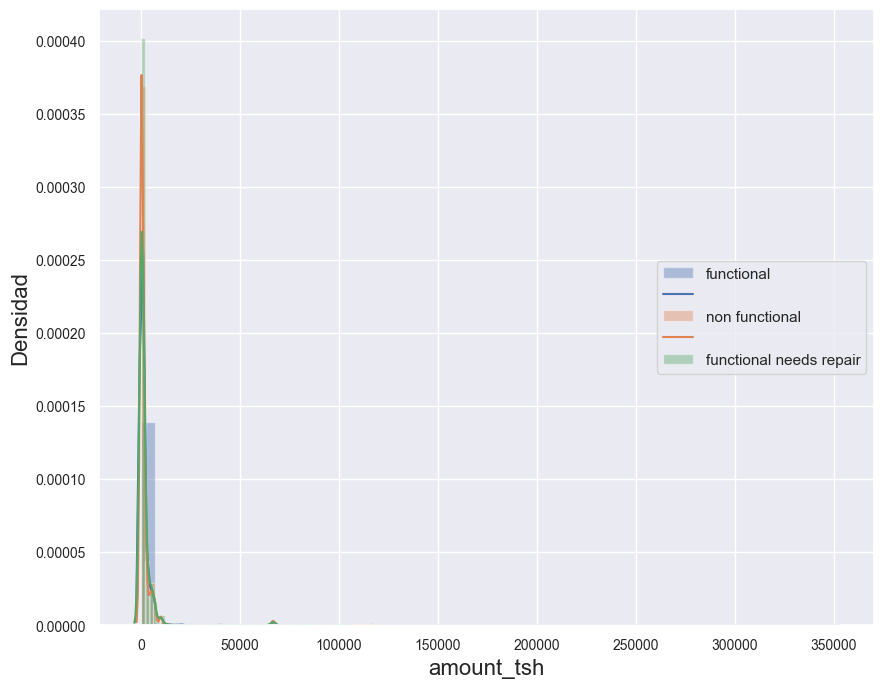

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

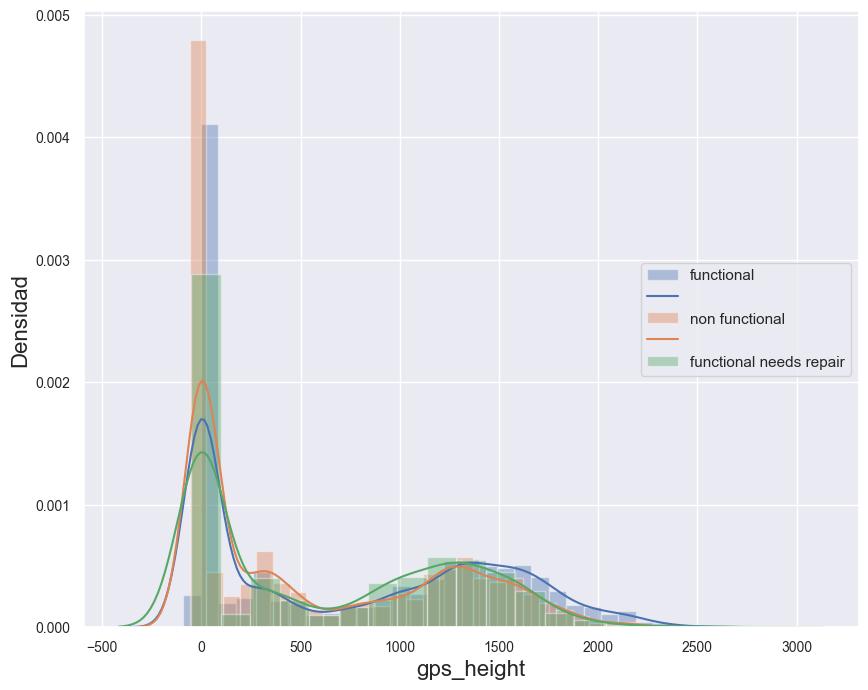

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

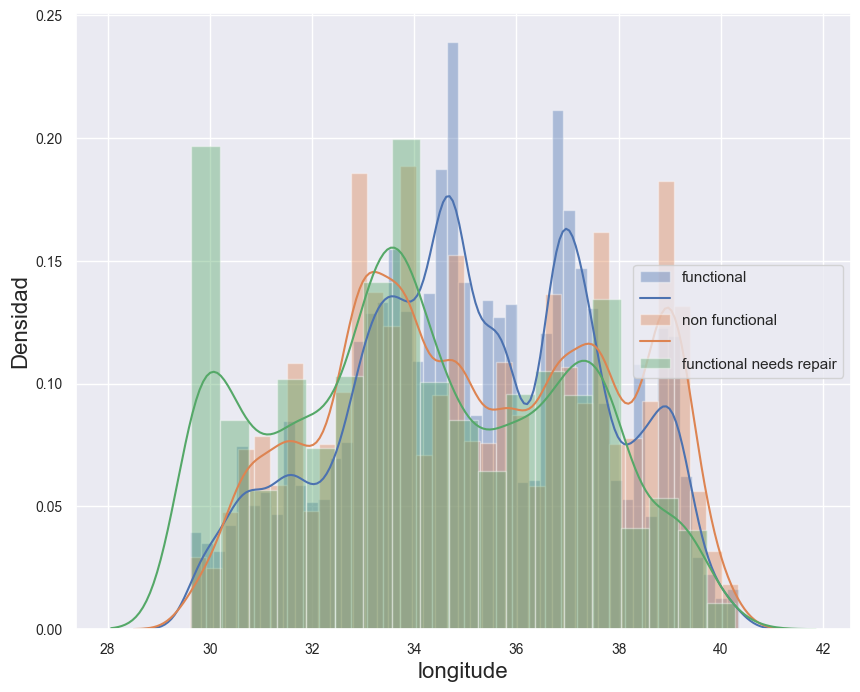

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

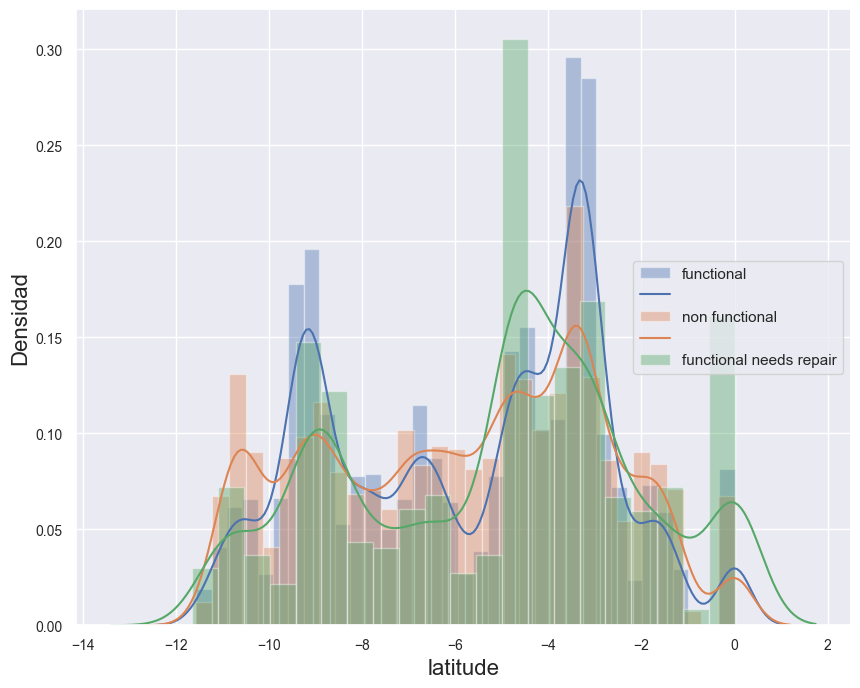

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

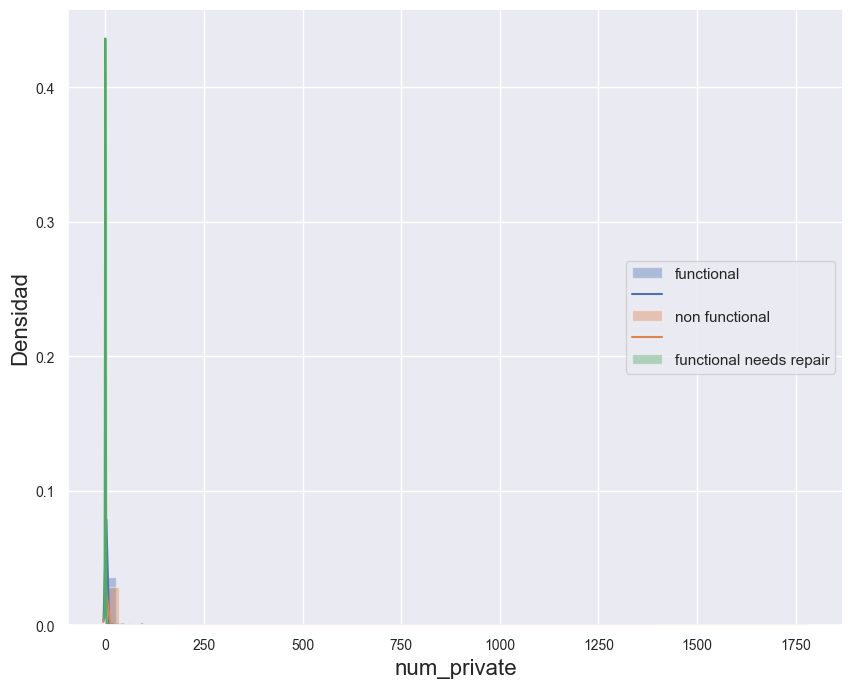

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

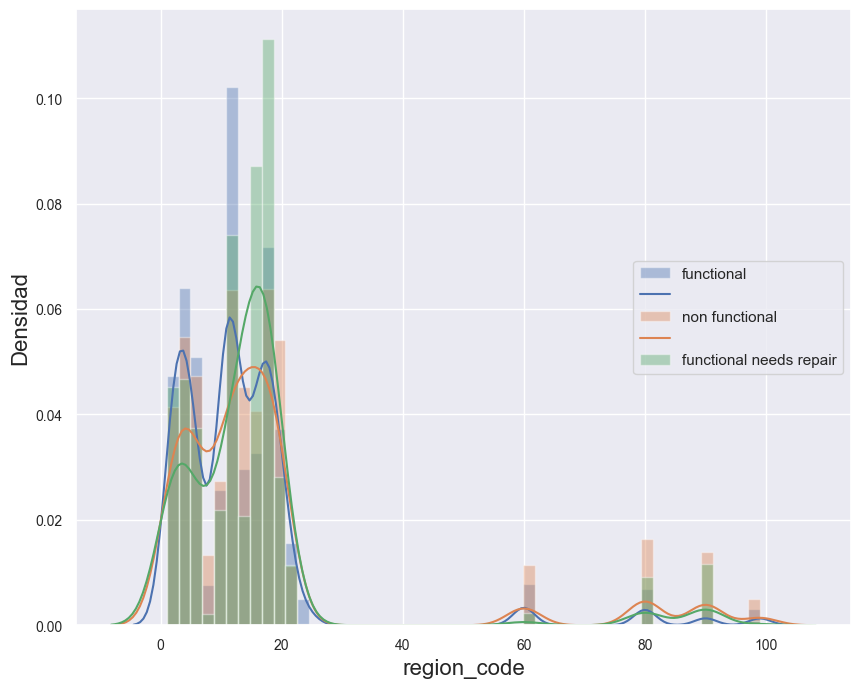

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

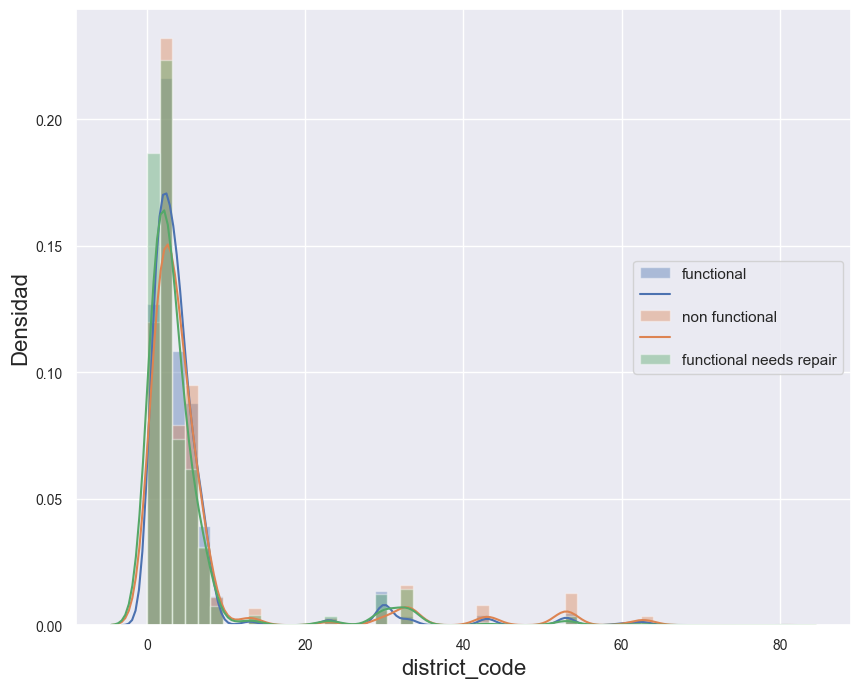

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

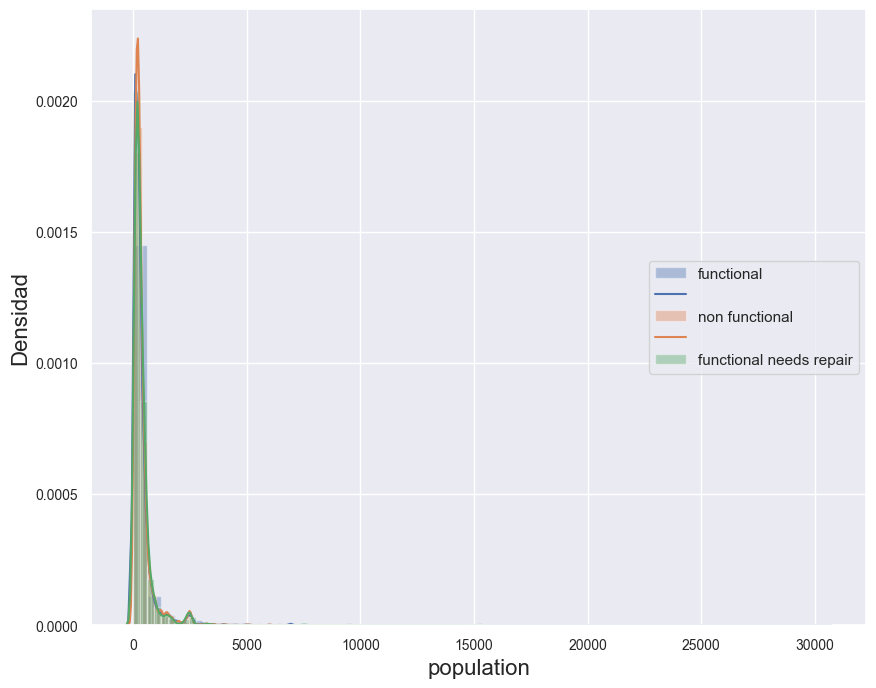

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

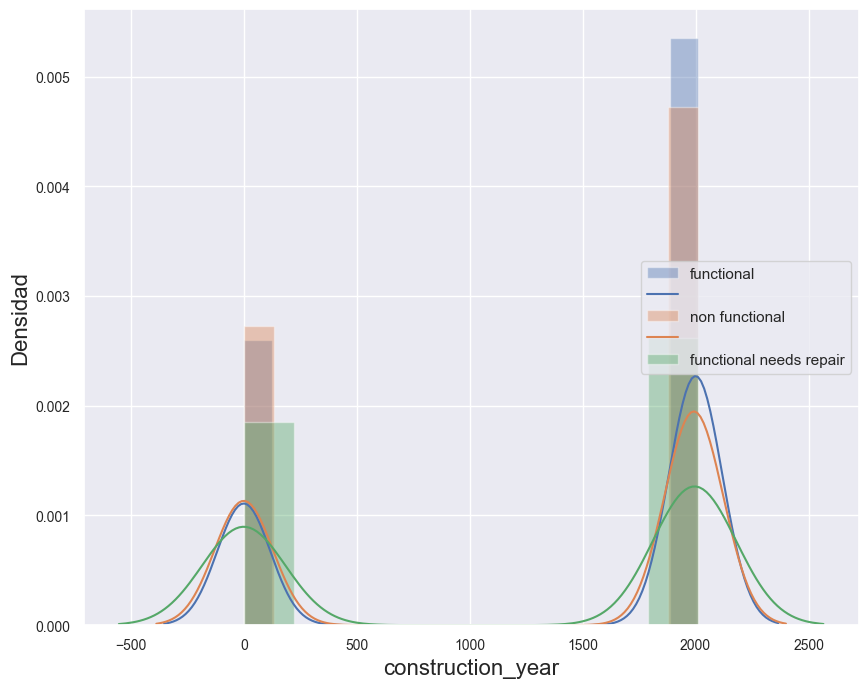

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

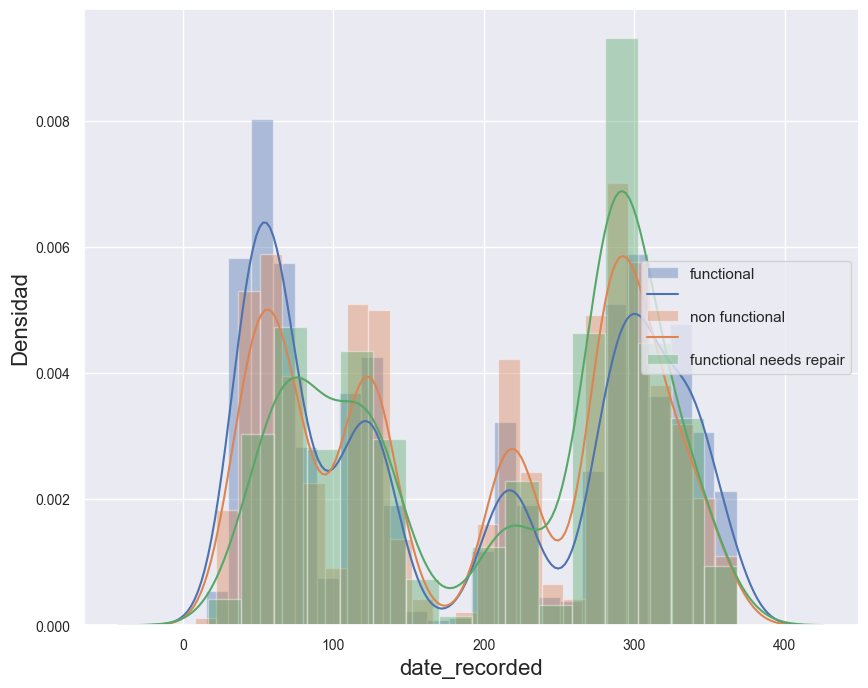

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

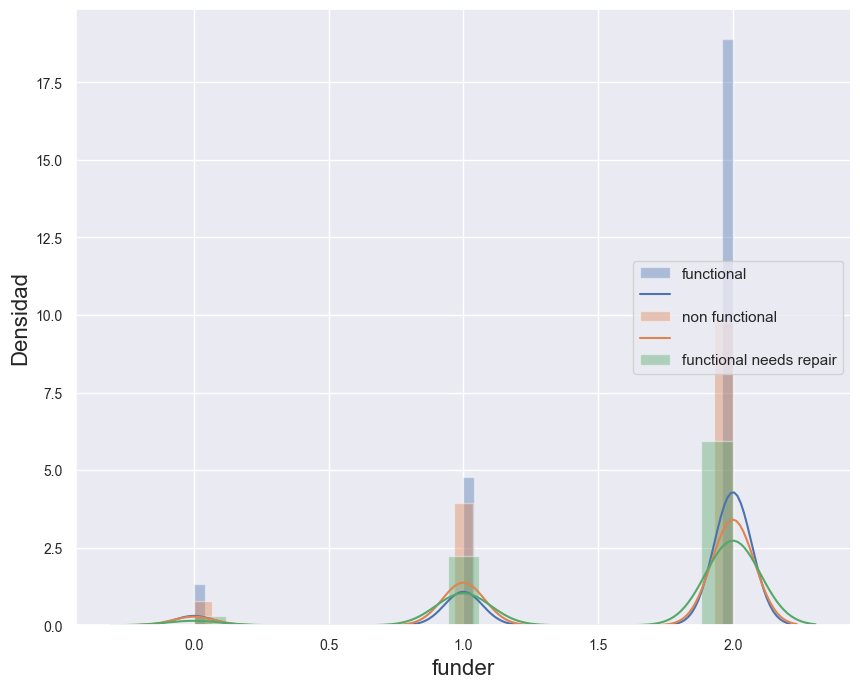

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

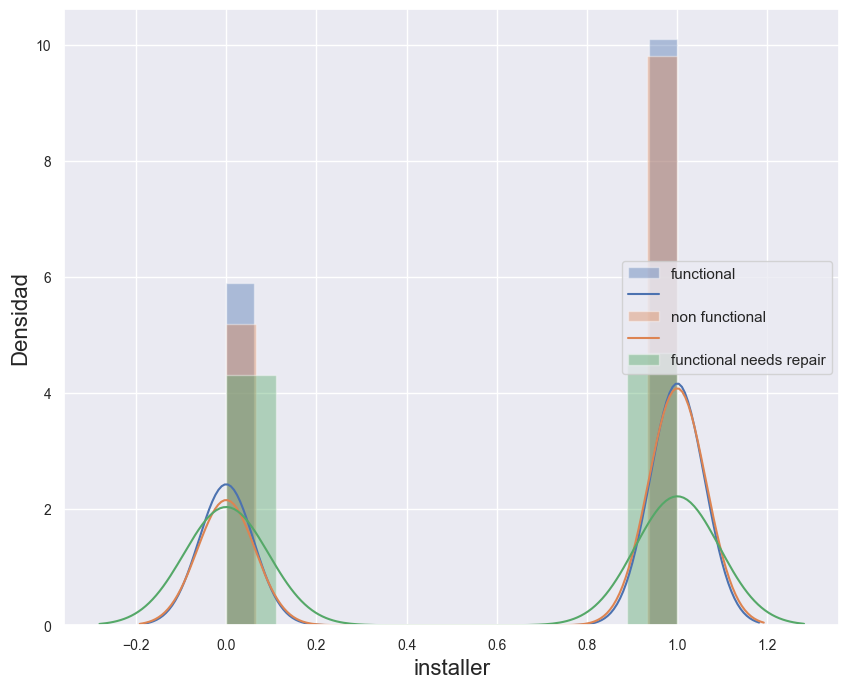

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

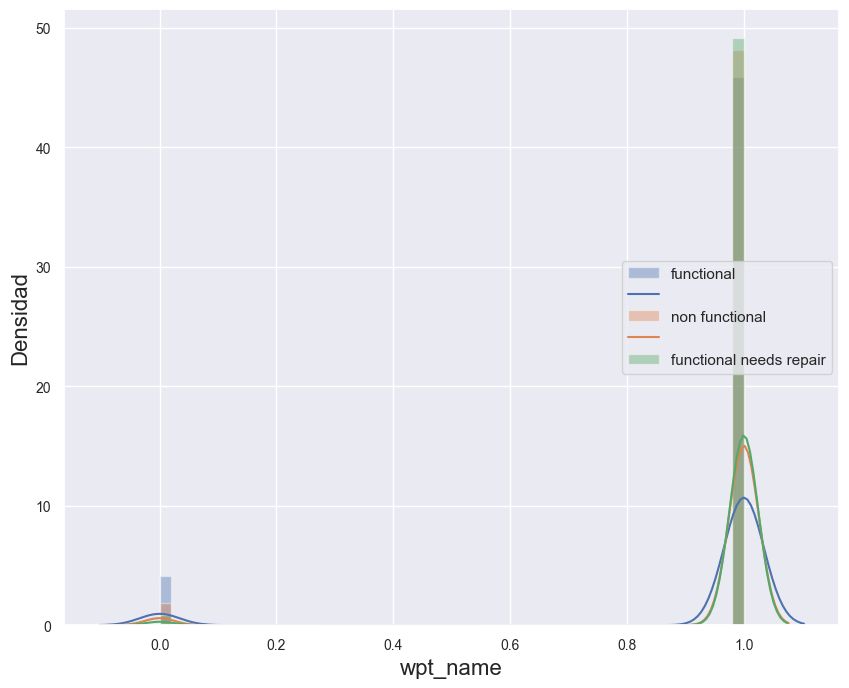

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

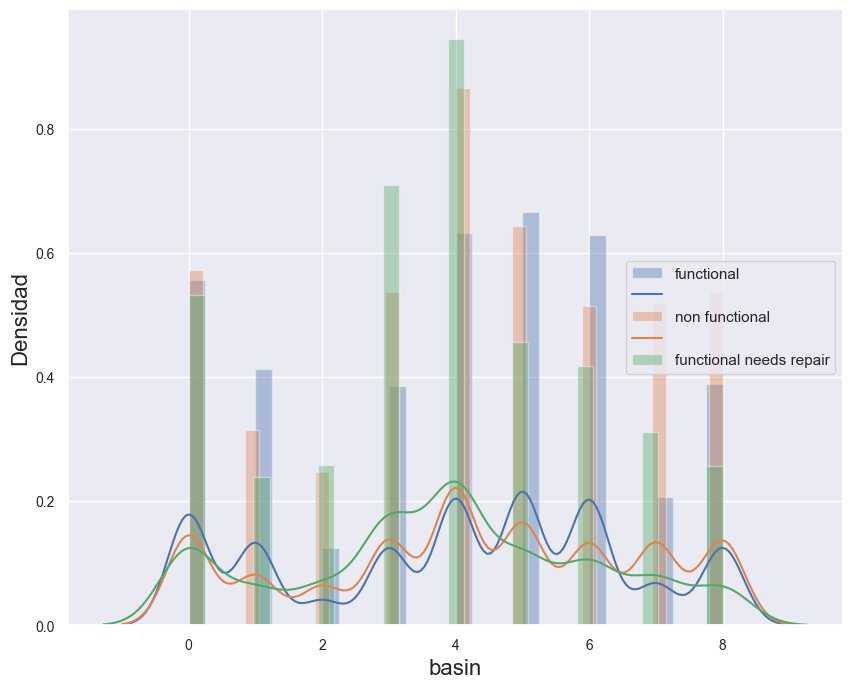

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

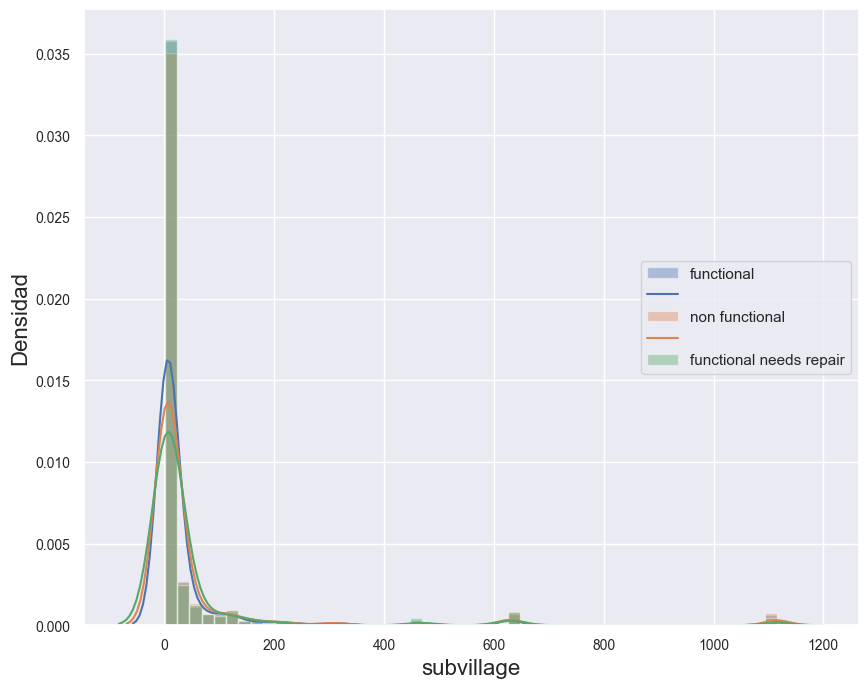

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

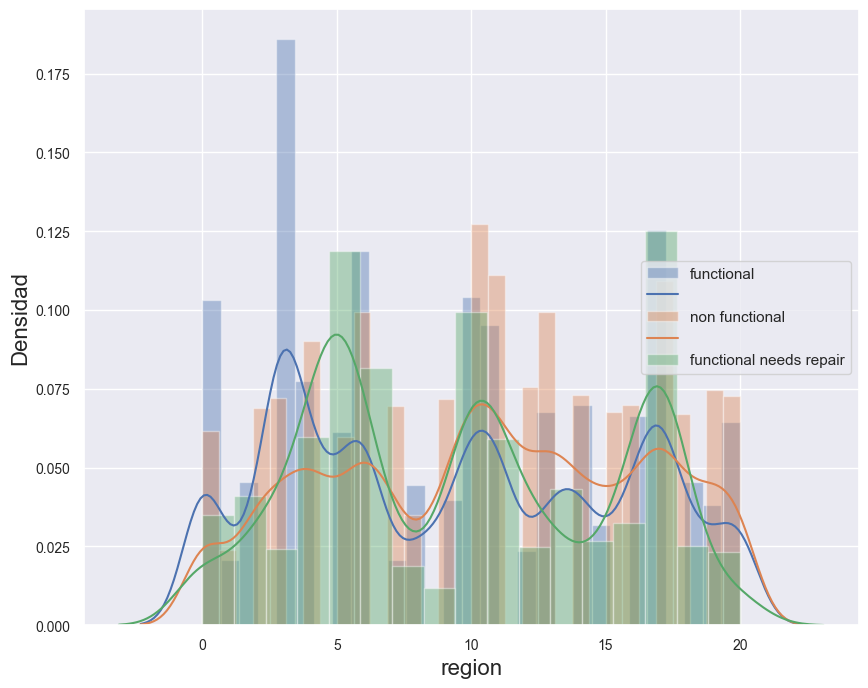

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

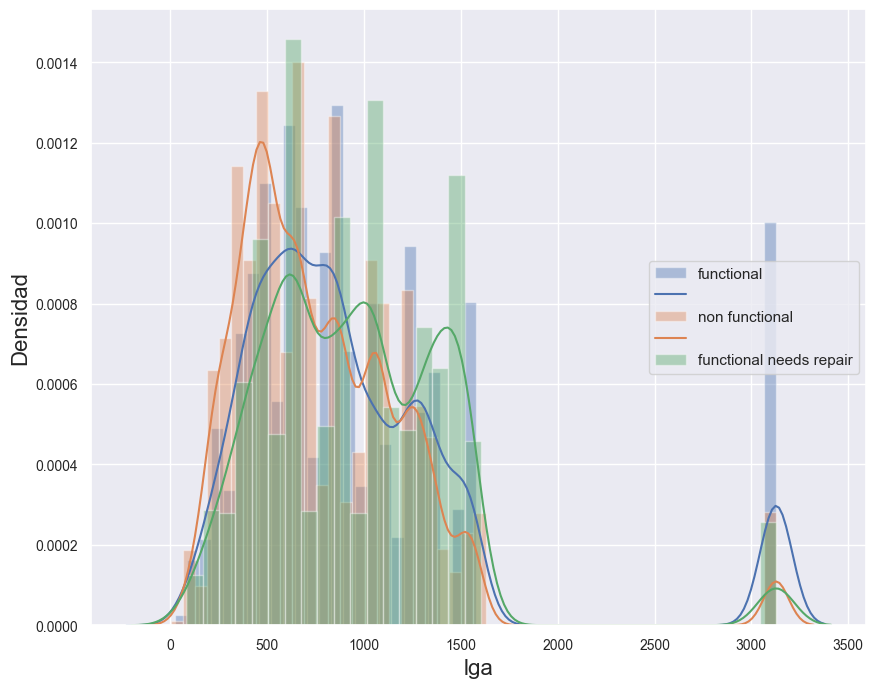

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

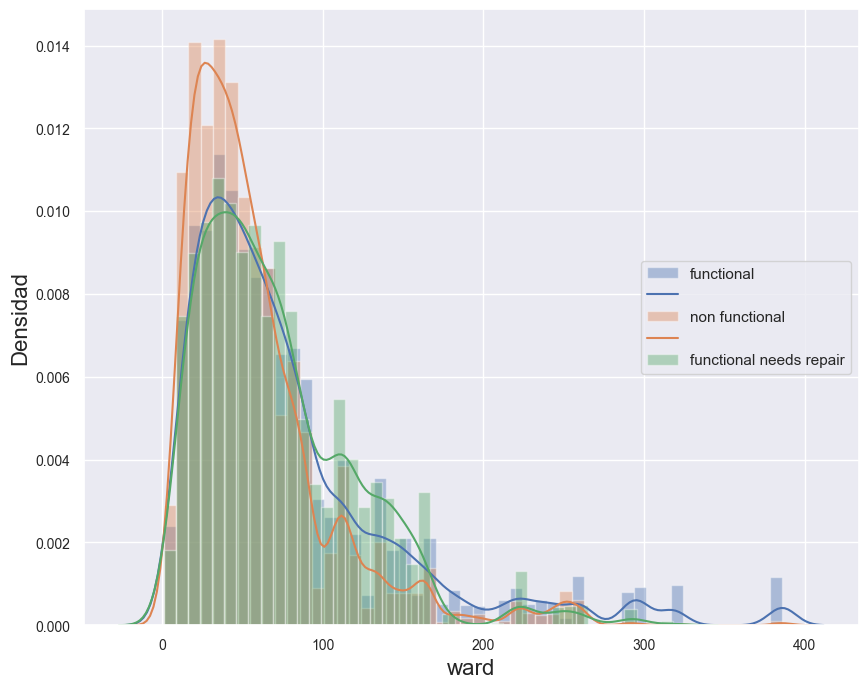

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

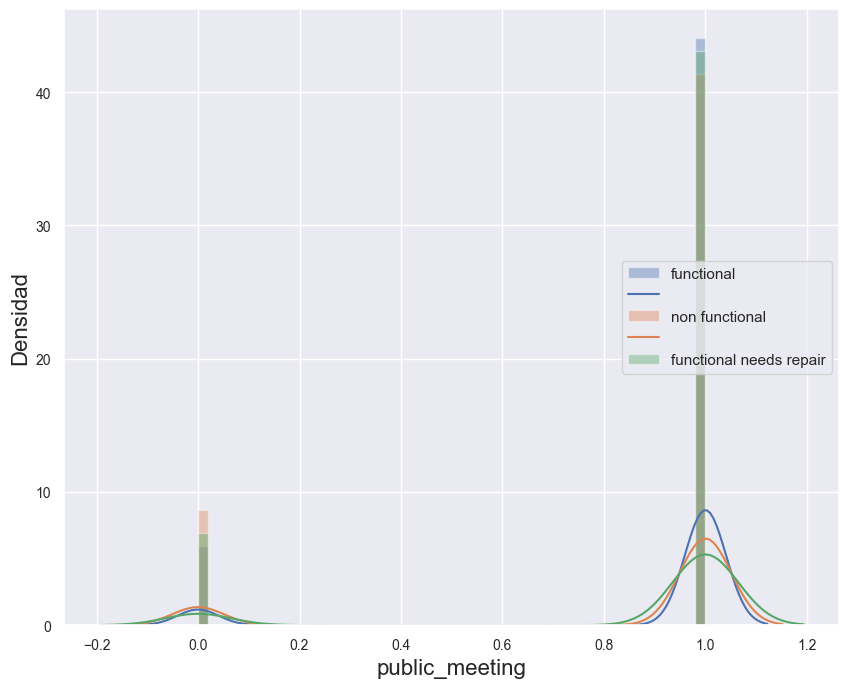

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/seaborn/distributions.py:2511: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function f

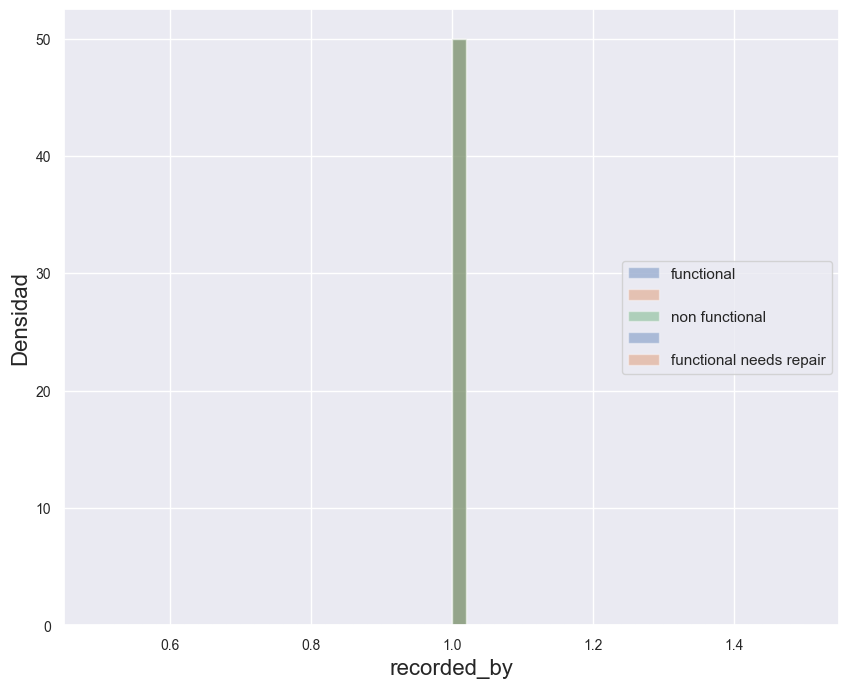

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

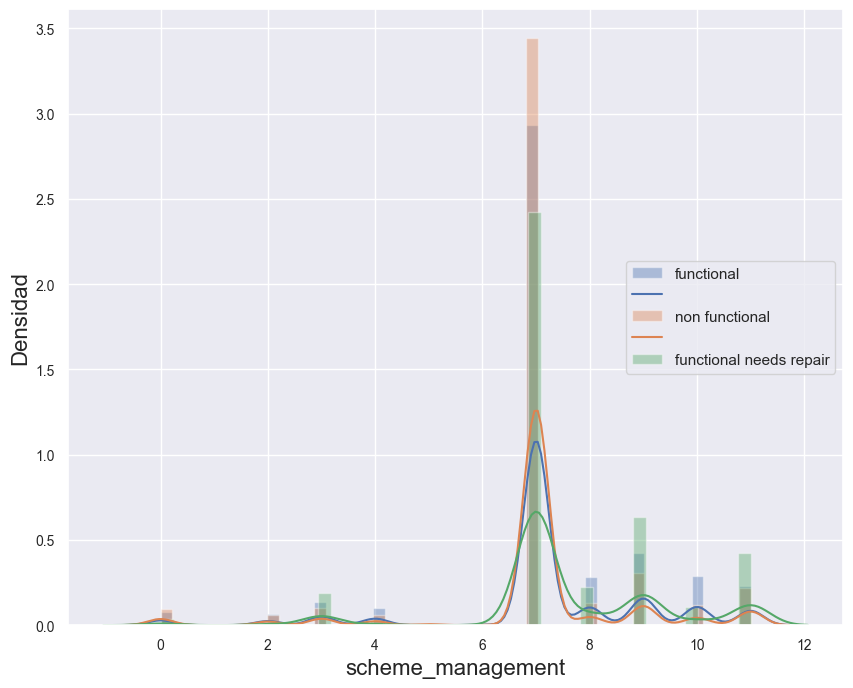

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

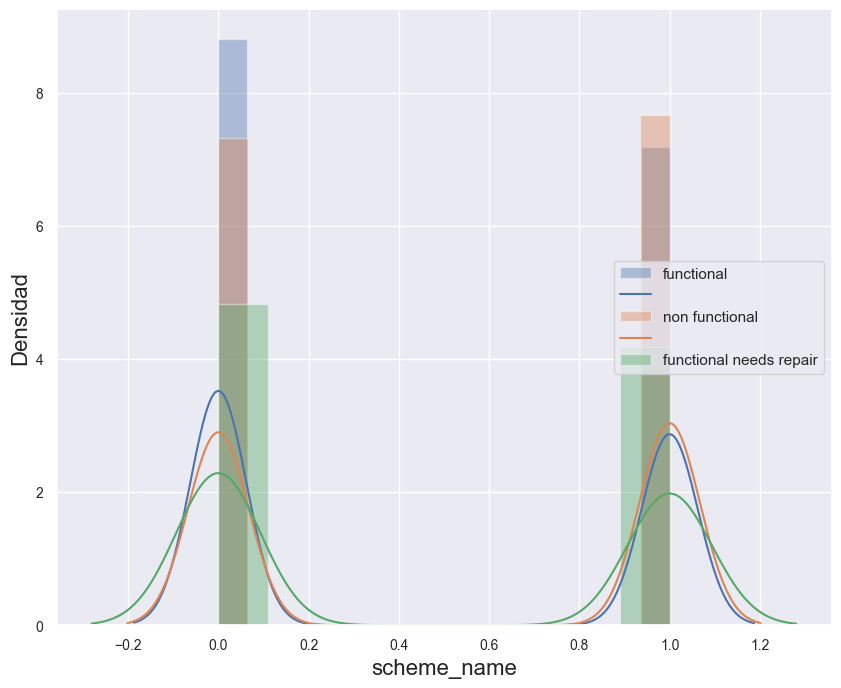

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

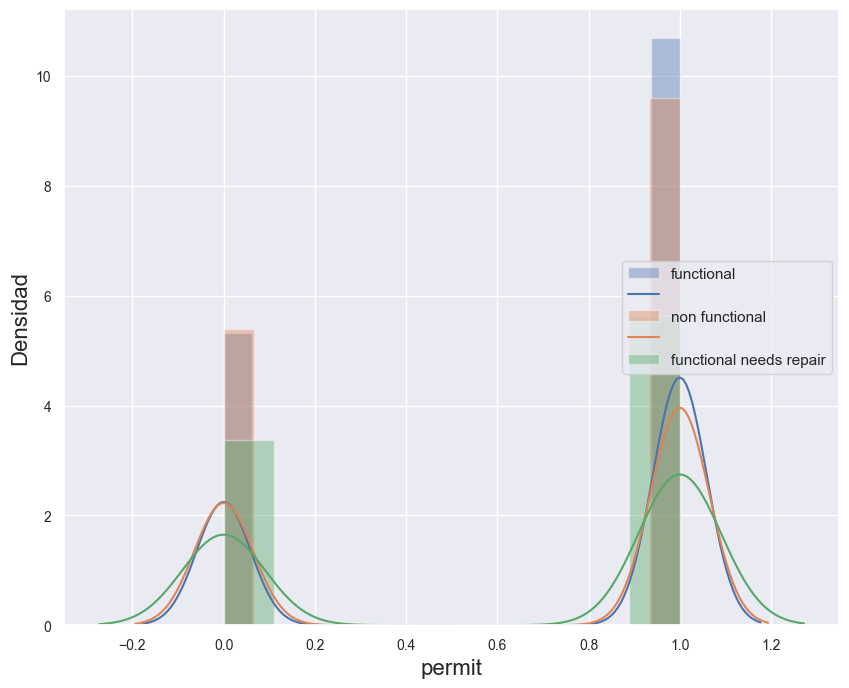

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

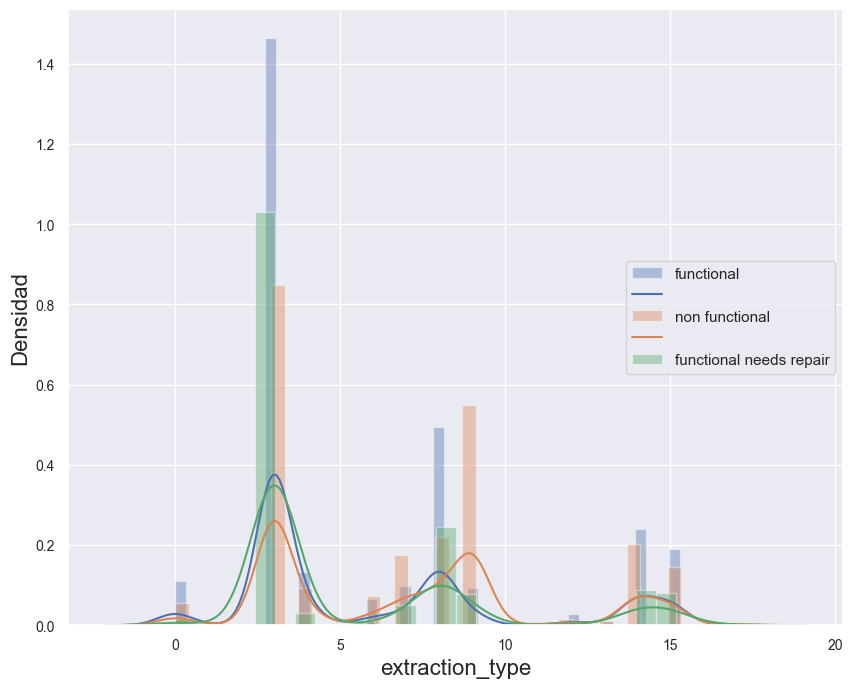

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

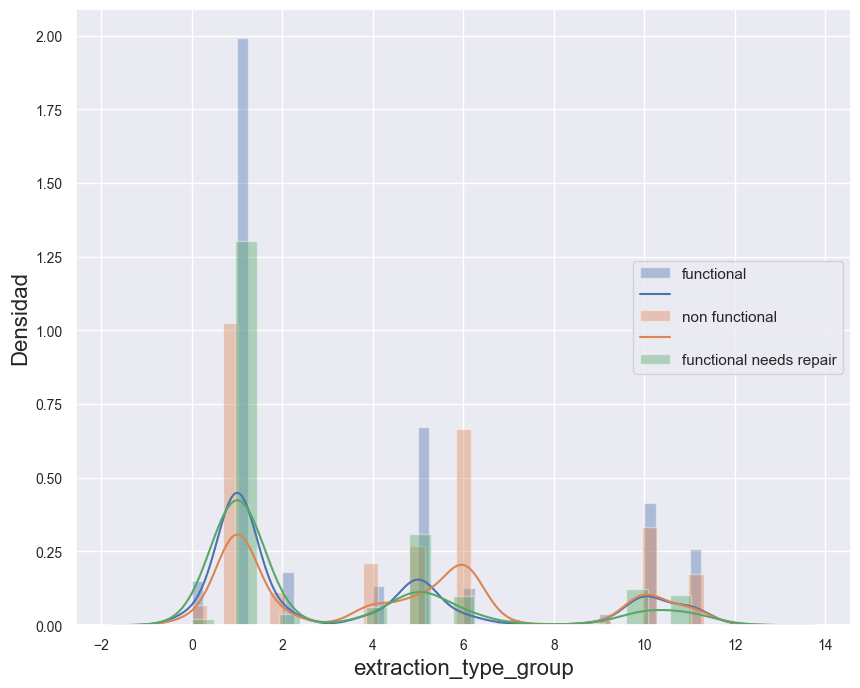

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

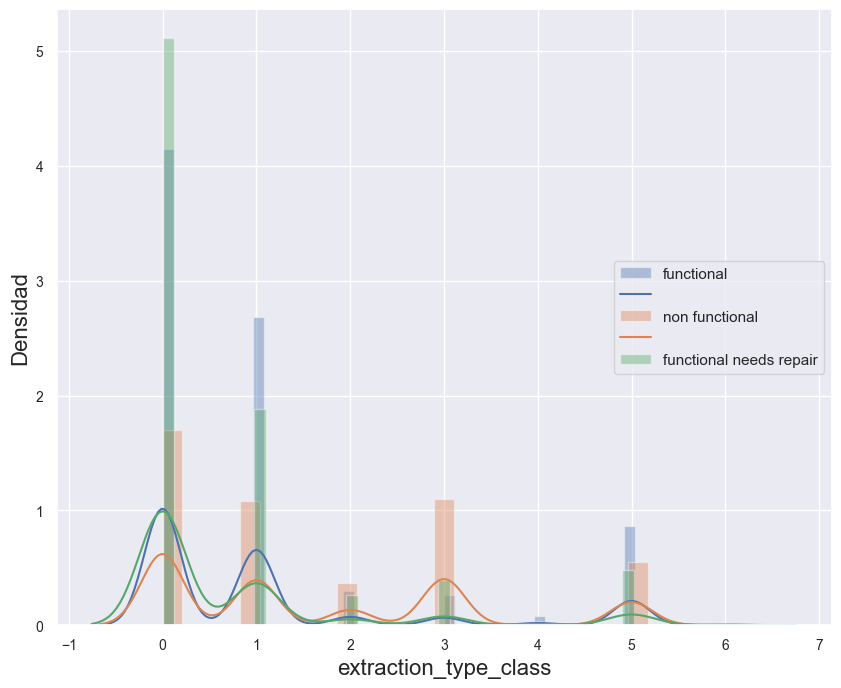

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

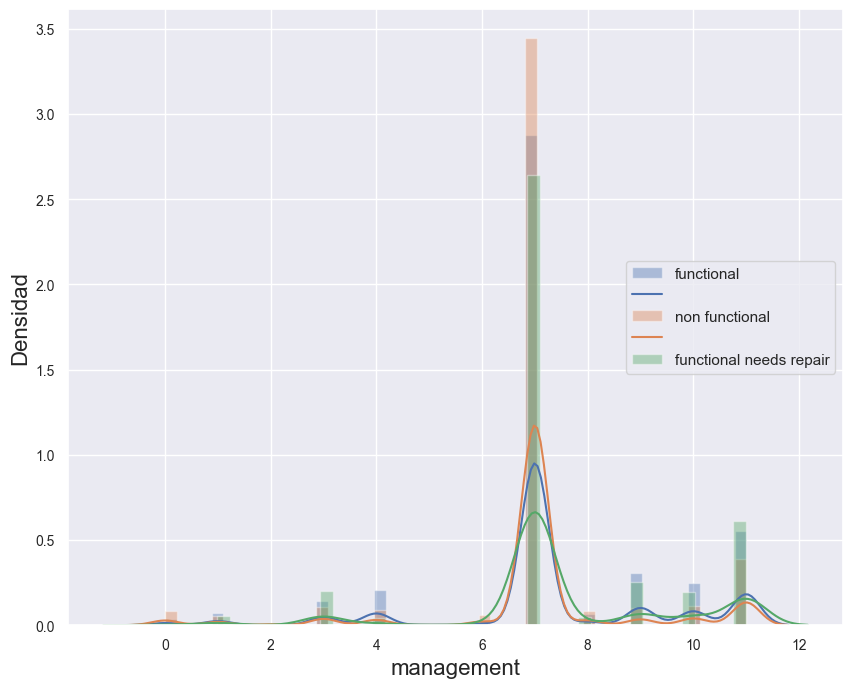

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

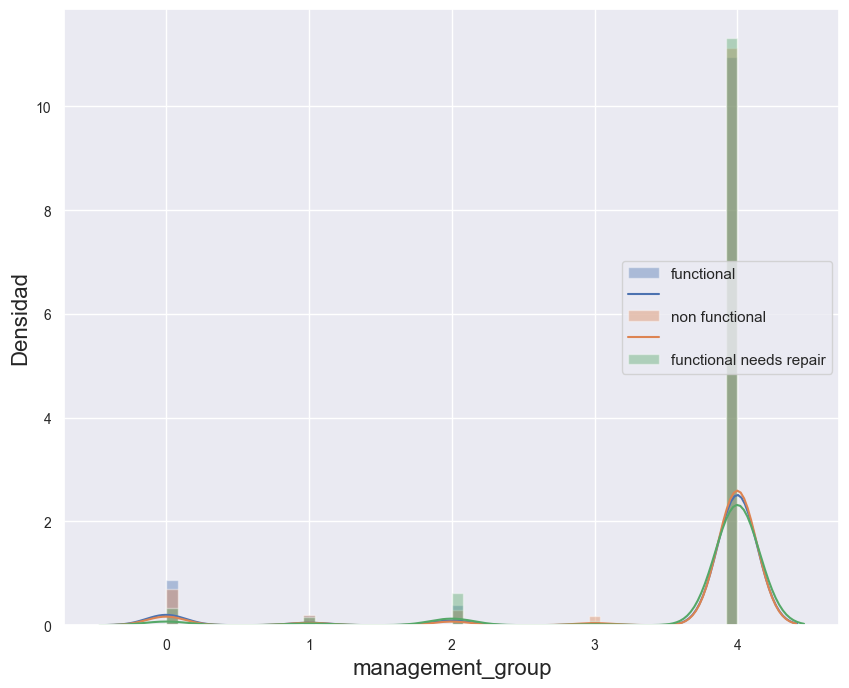

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

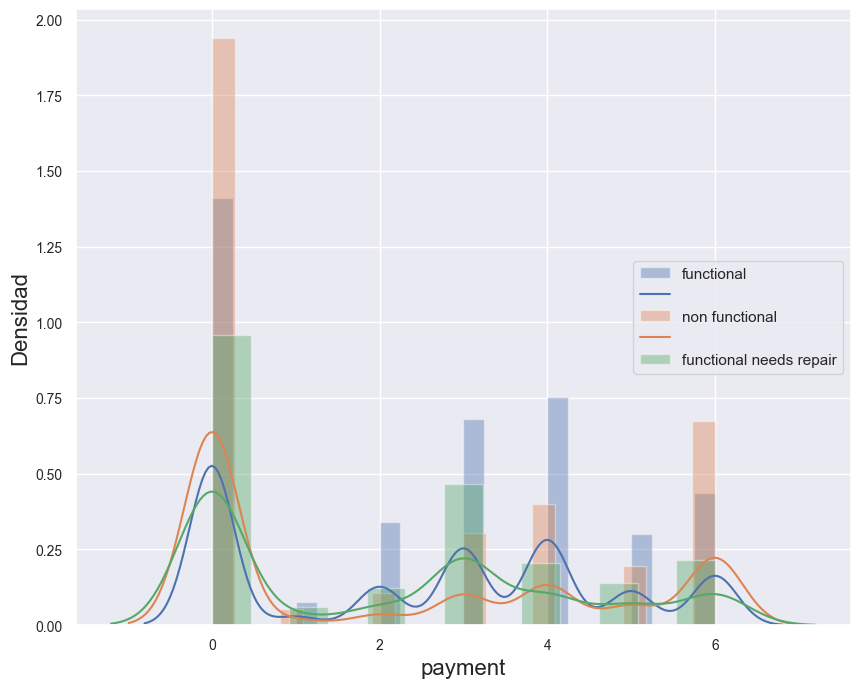

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

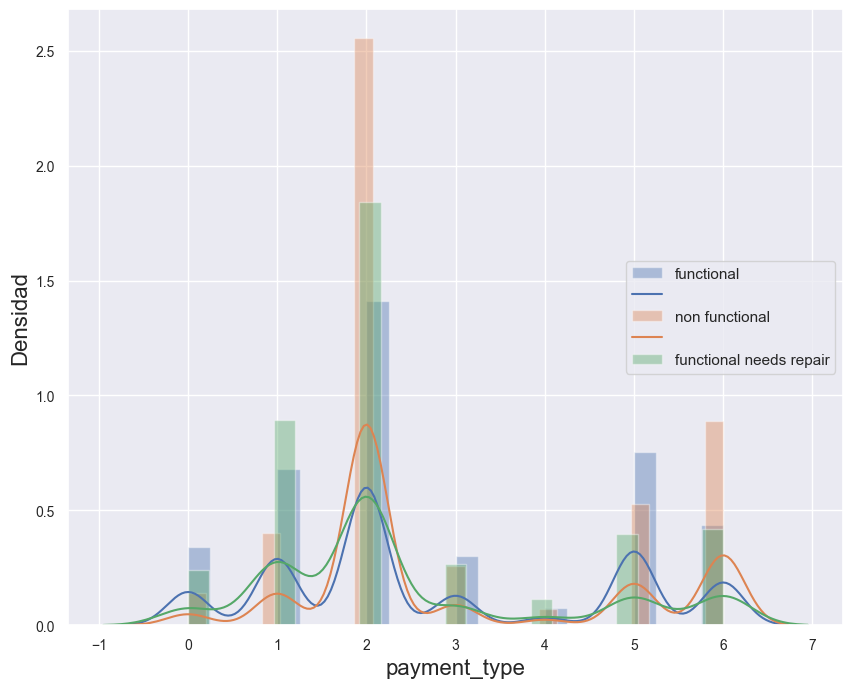

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

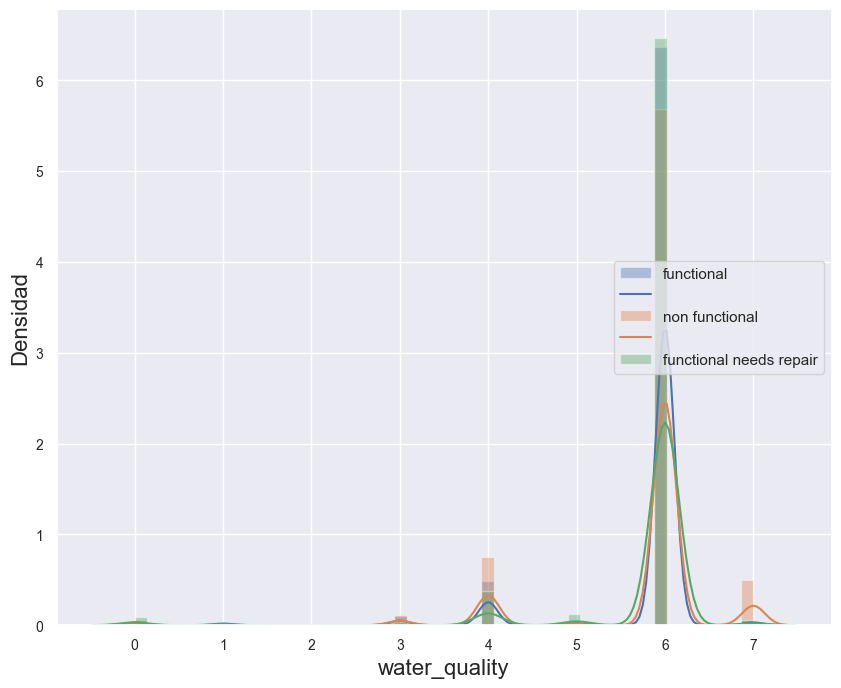

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

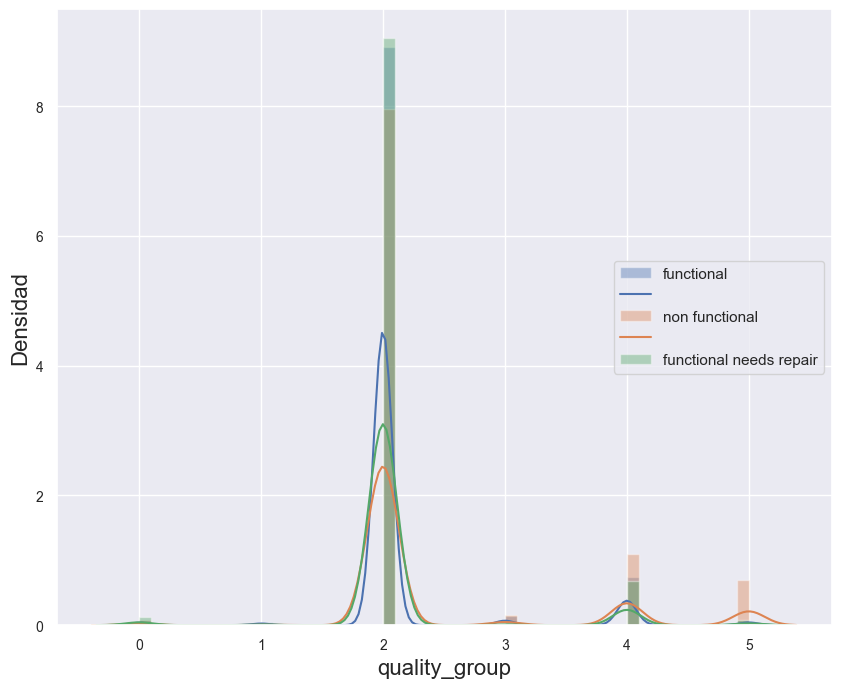

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

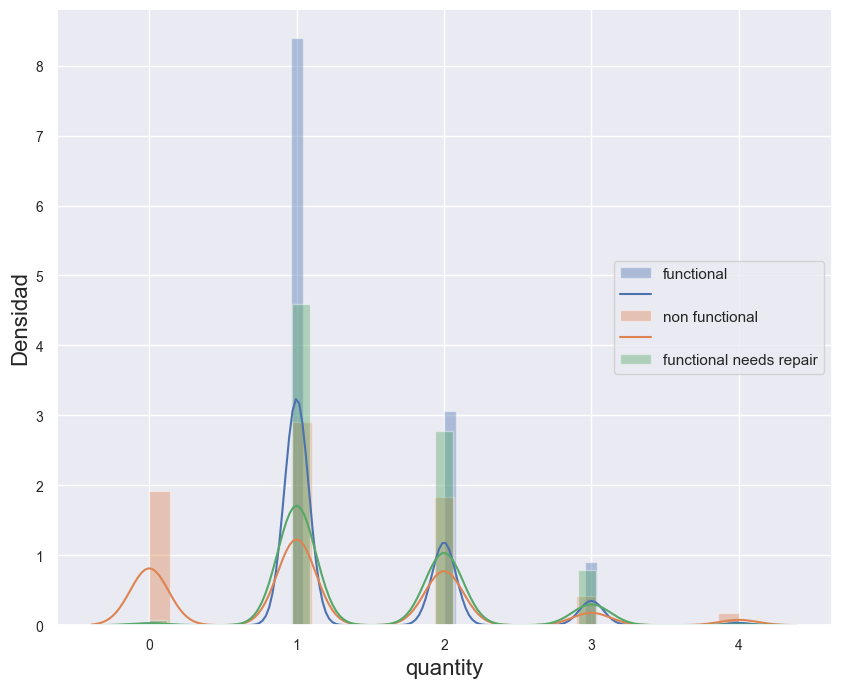

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

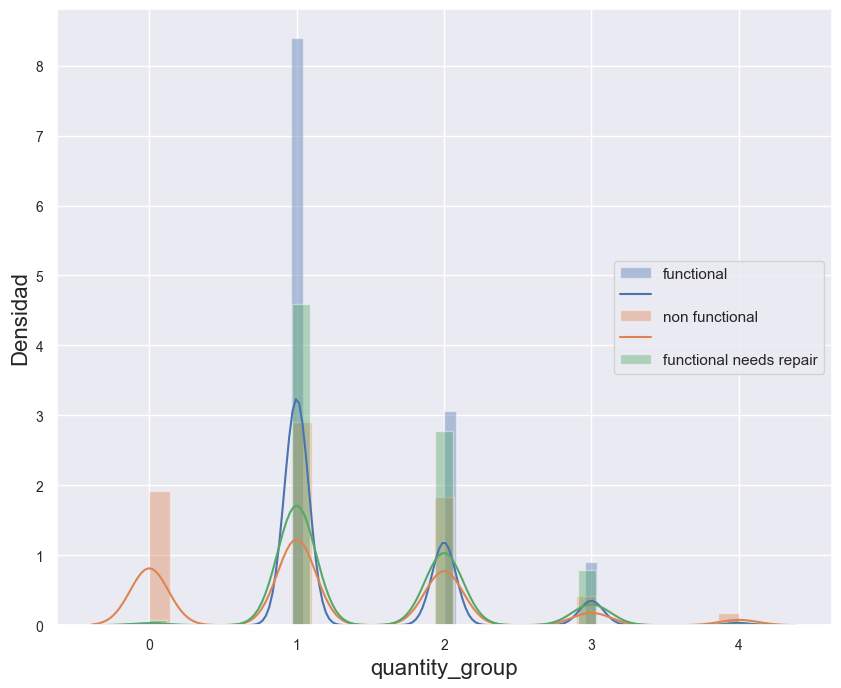

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

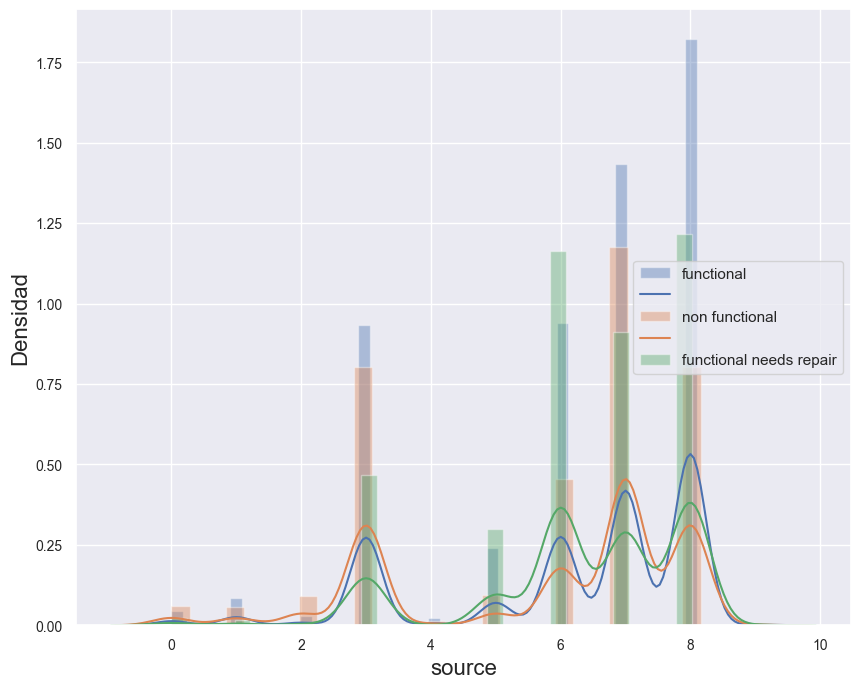

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

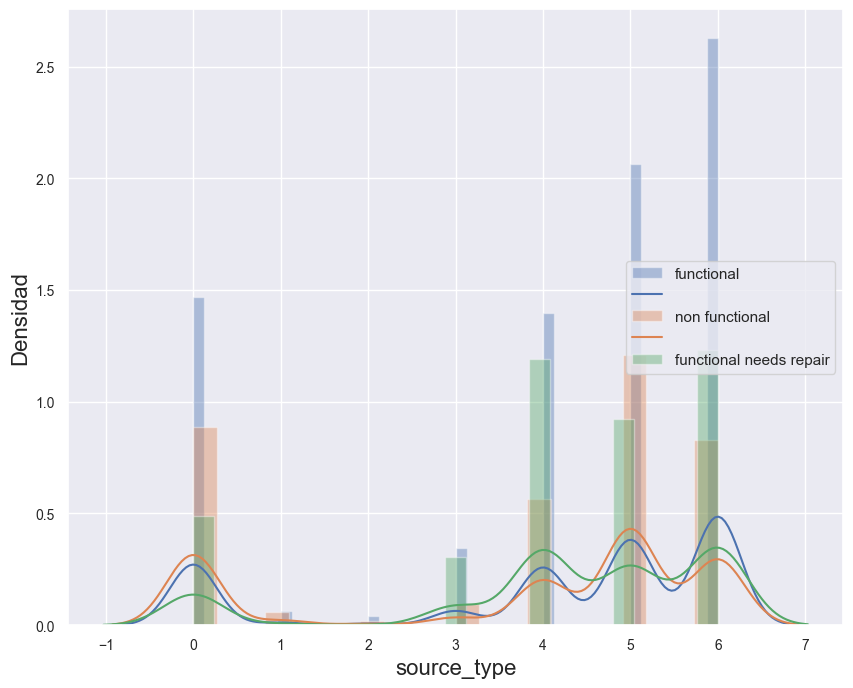

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

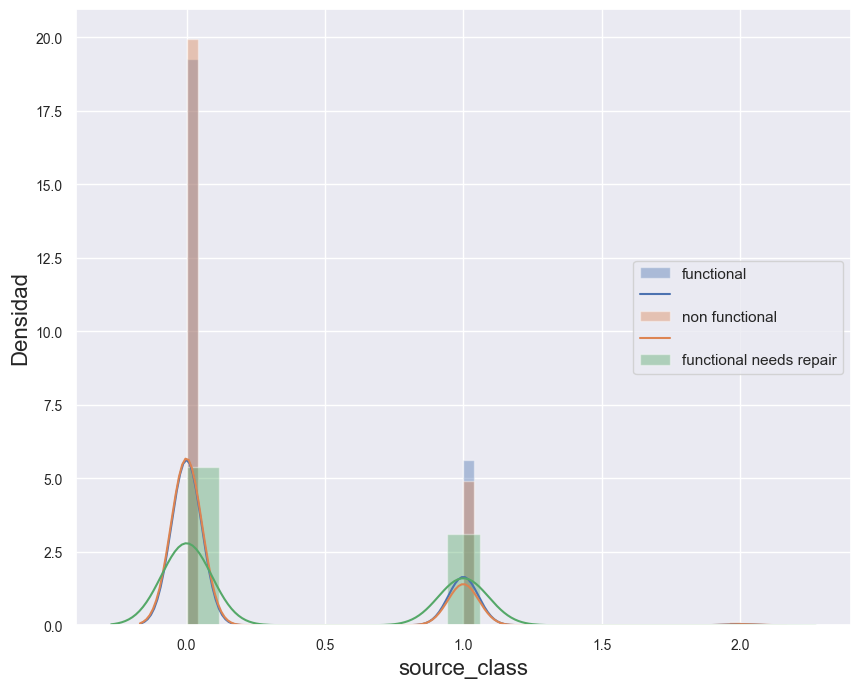

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

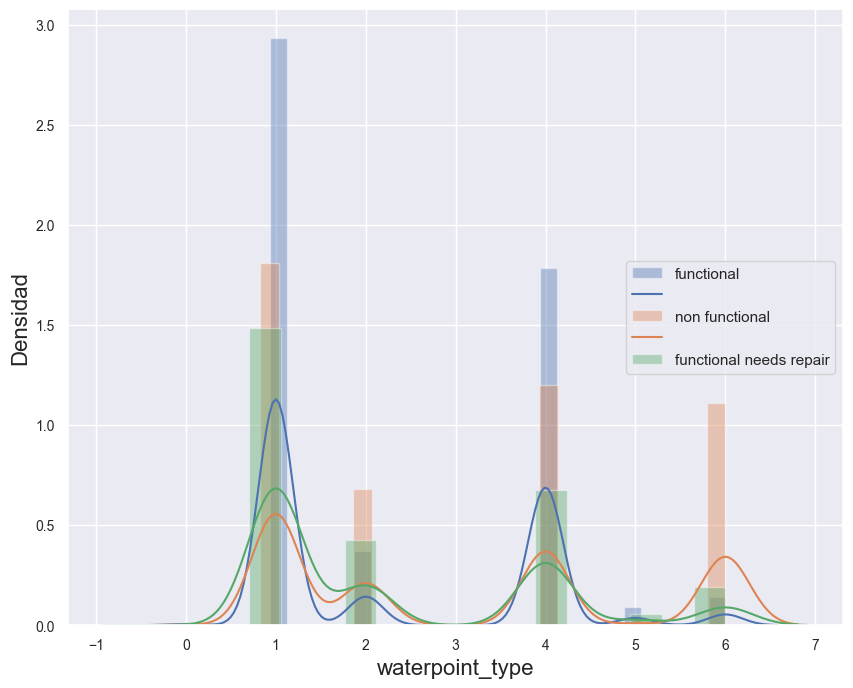

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

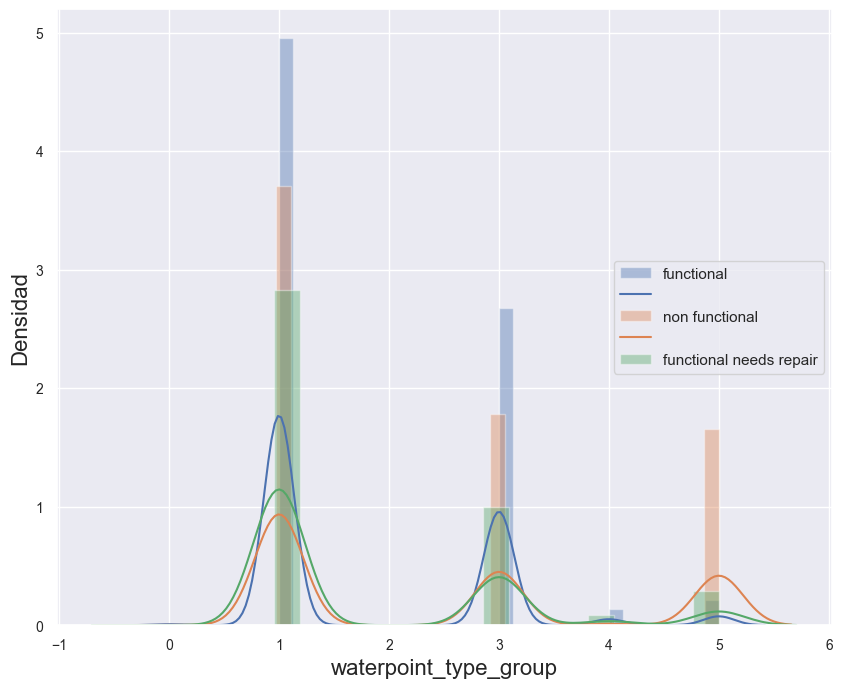

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/27

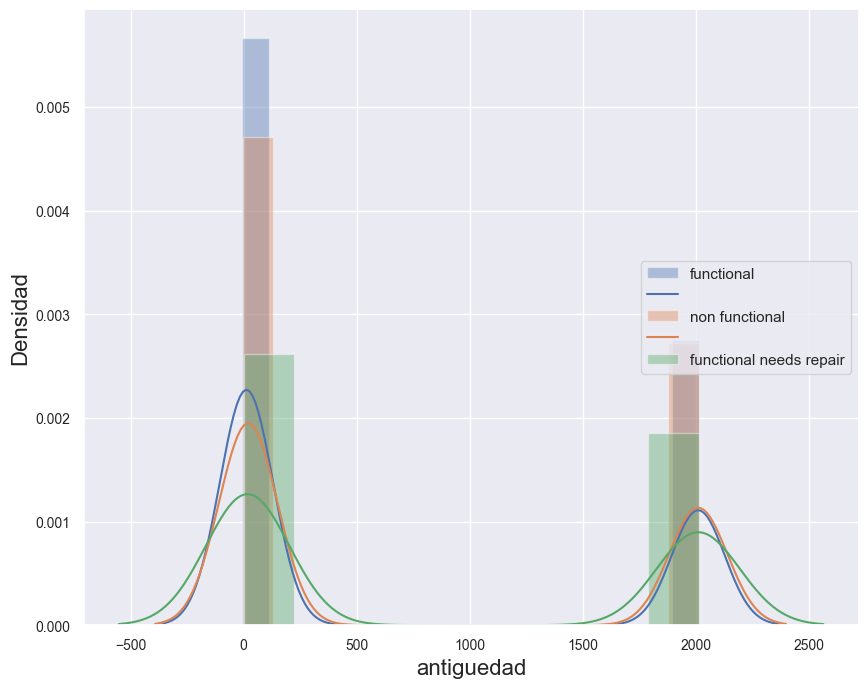

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/seaborn/distributions.py:2511: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

/var/folders/qr/tc_5_v553xv1hrcv98t9_5cc0000gn/T/ipykernel_1889/2785659928.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function f

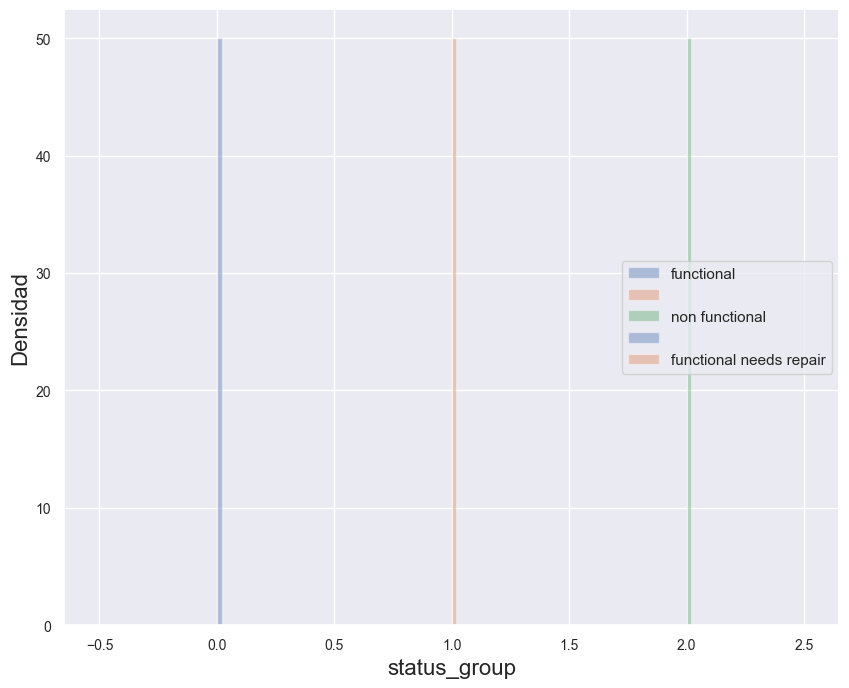

In [121]:
# Importamos las librerías matplotlib y seaborn:
import matplotlib.pyplot as plt
import seaborn as sns

plot_list = list(dataDep.columns) 

for var in plot_list:
    fig = plt.figure(figsize=(10,8))
    sns.set_style("darkgrid")
    # añadimos series para cada categoría 
    plt1 = sns.distplot(dataDep[dataDep.status_group==0][var], hist=True, label="functional")
    plt2 = sns.distplot(dataDep[dataDep.status_group==1][var], hist=True, label="non functional")
    plt3 = sns.distplot(dataDep[dataDep.status_group==2][var], hist=True, label="functional needs repair")
    plt.legend(labels=['functional',"",'non functional',"",'functional needs repair'], loc = 5)
    
    # Definimos el título de los ejes:
    plt.xlabel(f'{var}', fontsize=16)
    plt.ylabel('Densidad', fontsize=16)
    # Finalmente mostramos el gráfico:
    plt.show()

In [122]:
#creamos variables tramificadas de cada una de las variables originales de la lista
#optimizando la relación con la objetivo

from optbinning import MulticlassOptimalBinning

binning_list = ['longitude','latitude','population','amount_tsh','gps_height','construction_year']

for var in binning_list:
    optb = MulticlassOptimalBinning(name=var, max_n_bins=3)
    optb.fit(dataDep2[var].values, dataDep2.status_group)
    x_transform_bins = optb.transform(dataDep2[var].values, metric="bins")
    x_transform_bins
    dataDep2[f'{var}_tram'] = x_transform_bins
    print(f'Se ha creado la variable: {var}_tram')

(CVXPY) Apr 23 12:42:29 PM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.6.2534). Expected < 9.5.0.Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Apr 23 12:42:29 PM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.6.2534). Expected < 9.5.0.Please open a feature request on cvxpy to enable support for this version.')
Se ha creado la variable: longitude_tram
Se ha creado la variable: latitude_tram
Se ha creado la variable: population_tram
Se ha creado la variable: amount_tsh_tram
Se ha creado la variable: gps_height_tram
Se ha creado la variable: construction_year_tram


In [123]:
#transformamos variables numéricas tramificadas a numéricas de nuevo
dataDep2.longitude_tram.replace('[34.78, inf)',0,inplace=True)
dataDep2.longitude_tram.replace('[30.65, 34.78)',1,inplace=True)
dataDep2.longitude_tram.replace('(-inf, 30.65)',2,inplace=True)

dataDep2.latitude_tram.replace('[-4.84, inf)',0,inplace=True)
dataDep2.latitude_tram.replace('[-9.91, -4.84)',1,inplace=True)
dataDep2.latitude_tram.replace('(-inf, -9.91)',2,inplace=True)

dataDep2.population_tram.replace('[160.50, inf)',0,inplace=True)
dataDep2.population_tram.replace('[42.83, 160.50)',1,inplace=True)
dataDep2.population_tram.replace('(-inf, 42.83)',2,inplace=True)

dataDep2.amount_tsh_tram.replace('[26.33, inf)',0,inplace=True)
dataDep2.amount_tsh_tram.replace('(-inf, 26.33)',1,inplace=True)

dataDep2.gps_height_tram.replace('(-inf, 1359.50)',0,inplace=True)
dataDep2.gps_height_tram.replace('[1359.50, 1688.50)',1,inplace=True)
dataDep2.gps_height_tram.replace('[1688.50, inf)',2,inplace=True)

dataDep2.construction_year_tram.replace('[1998.50, inf)',0,inplace=True)
dataDep2.construction_year_tram.replace('(-inf, 980.00)',1,inplace=True)
dataDep2.construction_year_tram.replace('[980.00, 1998.50)',2,inplace=True)

In [124]:
#creamos variable de frecuencia de cada año para calcular cuantos puntos de agua se crearon por año
dataDep2["bombas_per_year"] = dataDep2.construction_year
counts_year = dataDep2["bombas_per_year"].value_counts().to_dict()
print(counts_year)
dataDep2["bombas_per_year"] = dataDep2["bombas_per_year"].map(counts_year)
dataDep2

{0: 20709, 2010: 2645, 2008: 2613, 2009: 2533, 2000: 2091, 2007: 1587, 2006: 1471, 2003: 1286, 2011: 1256, 2004: 1123, 2012: 1084, 2002: 1075, 1978: 1037, 1995: 1014, 2005: 1011, 1999: 979, 1998: 966, 1990: 954, 1985: 945, 1980: 811, 1996: 811, 1984: 779, 1982: 744, 1994: 738, 1972: 708, 1974: 676, 1997: 644, 1992: 640, 1993: 608, 2001: 540, 1988: 521, 1983: 488, 1975: 437, 1986: 434, 1976: 414, 1970: 411, 1991: 324, 1989: 316, 1987: 302, 1981: 238, 1977: 202, 1979: 192, 1973: 184, 2013: 176, 1971: 145, 1960: 102, 1967: 88, 1963: 85, 1968: 77, 1969: 59, 1964: 40, 1962: 30, 1961: 21, 1965: 19, 1966: 17}


,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,source_class,waterpoint_type,status_group,longitude_tram,latitude_tram,population_tram,amount_tsh_tram,gps_height_tram,construction_year_tram,bombas_per_year
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,0,1,0,0,1,1,0,1,0,979
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,1,1,0,1,0,0,0,1,0,2645
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,1,2,0,0,0,0,1,0,0,2533
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,0,2,1,0,2,1,0,0,2,434
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,1,1,0,1,0,0,0,0,1,20709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,0,1,0,0,0,1,1,0,0,979
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,1,1,0,0,1,1,0,0,2,811
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,0,4,0,1,1,1,0,0,1,20709
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,0,4,0,0,1,0,0,0,1,20709


In [125]:
#concatenamos la variable creada anteriormente, antiguedad
dataDep2 = pd.concat([dataDep2,dataDep.antiguedad], axis=1)
dataDep2

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,waterpoint_type,status_group,longitude_tram,latitude_tram,population_tram,amount_tsh_tram,gps_height_tram,construction_year_tram,bombas_per_year,antiguedad
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,1,0,0,1,1,0,1,0,979,12
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,1,0,1,0,0,0,1,0,2645,3
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,2,0,0,0,0,1,0,0,2533,4
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,2,1,0,2,1,0,0,2,434,27
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,1,0,1,0,0,0,0,1,20709,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,1,0,0,0,1,1,0,0,979,14
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,1,0,0,1,1,0,0,2,811,15
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,4,0,1,1,1,0,0,1,20709,2011
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,4,0,0,1,0,0,0,1,20709,2011


# Probamos mejor modelo con variables tramificadas y nuevas variables creadas

In [126]:
#evaluamos correlaciones de las tramificadas con la objetivo
corr = abs(dataDep2.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
construction_year_tram,0.176426
waterpoint_type,0.127764
gps_height_tram,0.124780
ward,0.117546
wpt_name,0.099104
population_tram,0.097391
gps_height,0.096408
quality_group,0.087941
lga,0.084851


In [127]:
dataDep2

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,waterpoint_type,status_group,longitude_tram,latitude_tram,population_tram,amount_tsh_tram,gps_height_tram,construction_year_tram,bombas_per_year,antiguedad
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,1,0,0,1,1,0,1,0,979,12
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,1,0,1,0,0,0,1,0,2645,3
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,2,0,0,0,0,1,0,0,2533,4
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,2,1,0,2,1,0,0,2,434,27
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,1,0,1,0,0,0,0,1,20709,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,1,0,0,0,1,1,0,0,979,14
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,1,0,0,1,1,0,0,2,811,15
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,4,0,1,1,1,0,0,1,20709,2011
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,4,0,0,1,0,0,0,1,20709,2011


**Esta vez realizamos un proceso forward donde partimos de la mejor combinación de variables (dateDep2) más todas las variables tramificadas y nuevas creadas; y vamos agregando una a una las variables nuevas generadas hasta conseguir la(s) que mejor funcionen. En este caso, a pesar de que la tabla de correlaciones posicionaba muy alto a varias de nuestras versiones tramificadas, al probar en el modelo, incluso reemplazando la variable original por su versión tramificada o dejando ambas versiones, el mejor desempeño se obtuvo al utilizar únicamente la variable tramificada "amount_tsh_tram" y dejando su versión original, de las demás variables nos quedamos con sus versiones originales ya que su versión tramificada no mejoraba el modelo.**

Las variables nuevas creadas, antiguedad y bombas_per_year tampoco mejoraron al modelo por lo que no las hemos incluido tampoco. 

In [128]:
#dataDep3 = dataDep2.copy()
dataDep3 = dataDep2.drop(['longitude_tram','latitude_tram','population_tram','gps_height_tram','construction_year_tram','bombas_per_year','antiguedad'],axis=1)
dataDep3

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,status_group,amount_tsh_tram
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,2,0,2,1,1,6,0,1,0,0
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,0,2,2,2,2,3,1,1,0,0
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,4,5,2,1,1,1,1,2,0,1
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,0,2,2,0,0,0,0,2,1,0
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,0,2,2,3,3,3,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,4,5,2,1,1,6,0,1,0,1
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,2,0,2,1,1,4,1,1,0,0
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,3,1,1,1,1,0,0,4,0,0
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,0,2,2,2,2,5,0,4,0,0


In [129]:
#partición training-test de dataset con mejores variables y nuestra variable tramificada nueva
X_train, X_test, y_train, y_test = train_test_split (dataDep3.drop('status_group', axis=1), 
                                                     dataDep3.status_group,
                                                     test_size = 0.2,
                                                     random_state = 0,
                                                     stratify = dataDep3.status_group)

In [130]:
#Mejor modelo random forest - conjunto de arboles de decisión
classifier8 = RandomForestClassifier().fit(X_train, y_train)
pred8 = classifier8.predict(X_test)
predprob8 = classifier8.predict_proba(X_test)

In [131]:
roc_auc_score(y_test,predprob8,multi_class='ovr')

0.9005801017974893

In [132]:
score8 = pred8 == y_test
score8.value_counts()

True     9614
False    2266
Name: status_group, dtype: int64

In [133]:
print(classification_report(pred8,y_test))

              precision    recall  f1-score   support

           0       0.89      0.80      0.85      7170
           1       0.78      0.85      0.81      4196
           2       0.34      0.58      0.43       514

    accuracy                           0.81     11880
   macro avg       0.67      0.74      0.70     11880
weighted avg       0.83      0.81      0.82     11880



In [134]:
X = dataDep3.drop('status_group', axis=1)
y = dataDep3.status_group

In [135]:
cv = cross_val_score(
    classifier8,
    X, 
    y,
    scoring = "accuracy",
    cv = 5
)
print(cv)
print("CV Accuracy:", cv.mean(), np.std(cv))

[0.81069024 0.80909091 0.81287879 0.80496633 0.80538721]
CV Accuracy: 0.8086026936026937 0.0030477425596021073


**El accuracy score en CV es ligeramente mejor cuando incluimos la variable nueva tramificada "amount_tsh_tram".**

In [136]:
#con la función feature_importances_ obtenemos las variables más importantes o que mejor están funcionando dentro del modelo
imp = {}
for i in range(len(X.columns)):
    imp[X.columns[i]] = [classifier8.feature_importances_[i]]
pd.DataFrame.from_dict(imp, orient="index", columns=["Importance"]).sort_values("Importance", ascending=False).head(15).style.background_gradient()

,Importance
longitude,0.088260
latitude,0.085527
quantity,0.070409
quantity_group,0.069206
population,0.061115
amount_tsh,0.051665
gps_height,0.051177
date_recorded,0.050968
waterpoint_type,0.048295
subvillage,0.045395


# Tuning hiperparámetros

El mejor modelo hasta ahora ha sido el Random Forest, con las variables seleccionadas, por lo que probaremos con cuáles parámetros funcionan mejor para este modelo buscando optimizar aún más la capacidad predictiva. La métrica que usaremos de referencia será el accuracy, ya que hemos probado también con el parámetro scoring de roc_auc_ovo pero en este caso nos interesa por encima de todo maximizar el accuracy y es la que nos ha dado mejor resultado.

In [137]:
#diccionario python con todos los hiperparametros que quiero probar
#el gridsearch iterará entre todas las posibles combinaciones diferentes de hiperparametros
grid_param = {
    'n_estimators': [100,300,500],
    'criterion': ['gini', 'entropy'],
    'max_depth': [16,20,22,24],
    'max_features': ['auto', 'sqrt'],

}

In [138]:
#para que la partición training-test en la CV se haga de forma estratificada
stratified_kfold = StratifiedKFold(n_splits=5,
                                       shuffle=True,
                                       random_state=11)

In [139]:
model_grid = GridSearchCV(estimator=classifier8,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=stratified_kfold,
                     n_jobs=-1)
#también hemos probado con el parámetro scoring='roc_auc_ovo'

In [140]:
model_grid.fit(X_train, y_train)

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and Ex

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=11, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [16, 20, 22, 24],
                         'max_features': ['auto', 'sqrt'],
                         'n_estimators': [100, 300, 500]},
             scoring='accuracy')

In [141]:
#se obtienen los mejores hiperparametros
print(model_grid.best_params_)

{'criterion': 'gini', 'max_depth': 20, 'max_features': 'sqrt', 'n_estimators': 500}


In [142]:
#los mejores scores
print(model_grid.best_score_)

0.8046296296296296


**Los mejores hiperparámetros según el grid search en este caso son: {'criterion': 'gini', 'max_depth': 20, 'max_features': 'sqrt', 'n_estimators': 500}**

Sin embargo hemos probado en el modelo y el que tiene mayor capacidad predictiva ha sido el que usa 'max_features': 'sqrt' y 'n_estimators': 500. Tanto criterion gini como entropy funcionan bien. Siendo entropy ligeramente superior.

**Es importante destacar que los resultados del gridsearch en ocasiones varían.**

# Submission con Feature Engineering sin oversampling

# Highest 82.14

In [143]:
#dataset de la X_test sin el id para predecir con el modelo
X_testDef = bombas_knn_moda[bombas_knn_moda['data']=='test']
X_testid = X_testDef['id']
X_testDef = X_testDef.drop(['data','id'],axis=1)
X_testDef

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,date_recorded,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,antiguedad
59400,350.000000,1996.0,35.290799,-4.059696,0.0,21.0,3.0,321.0,2012.0,292,...,6,2,3,3,5,3,1,6,5,1.0
59401,850.000000,1569.0,36.656709,-3.309214,0.0,2.0,2.0,300.0,2000.0,292,...,6,2,2,2,8,6,0,1,1,13.0
59402,333.333333,1567.0,34.767863,-5.004344,0.0,13.0,2.0,500.0,2010.0,289,...,6,2,2,2,5,3,1,6,5,3.0
59403,300.000000,267.0,38.058046,-9.418672,0.0,80.0,43.0,250.0,1987.0,279,...,6,2,0,0,7,5,0,6,5,26.0
59404,500.000000,1260.0,35.006123,-10.950412,0.0,10.0,3.0,60.0,2000.0,343,...,6,2,1,1,8,6,0,1,1,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74245,33.333333,34.0,38.852669,-6.582841,0.0,6.0,1.0,20.0,1988.0,36,...,6,2,1,1,6,4,1,1,1,23.0
74246,1000.000000,0.0,37.451633,-5.350428,0.0,4.0,7.0,2960.0,1994.0,61,...,4,4,2,2,7,5,0,4,3,17.0
74247,350.000000,1476.0,34.739804,-4.585587,0.0,13.0,2.0,200.0,2010.0,320,...,6,2,2,2,0,1,1,1,1,3.0
74248,91.666667,998.0,35.432732,-10.584159,0.0,10.0,2.0,150.0,2009.0,306,...,6,2,2,2,6,4,1,1,1,4.0


In [144]:
#transformamos a integer porque estaba en float, son los id
#los guardamos para poder concatenarlo luego con los resultados
X_testid=X_testid.astype(int)
X_testid

59400    50785
59401    51630
59402    17168
59403    45559
59404    49871
         ...  
74245    39307
74246    18990
74247    28749
74248    33492
74249    68707
Name: id, Length: 14850, dtype: int64

### Hacemos mismos cambios a la data de test después del Feature Engineering

Antes de proceder con la predicción, será necesario eliminar de la data de test real, las variables que no aportaban al modelo y agregar la variable tramificada que mejoró ligeramente el modelo amount_tsh_tram.

In [145]:
#agregamos la variable tramificada amount_tsh_tram al datset de X_test de la competencia
X_testDef2 = X_testDef.copy()
X_testDef2['amount_tsh_tram']= X_testDef2.amount_tsh
X_testDef2.loc[ X_testDef2['amount_tsh_tram'] < 26.33, 'amount_tsh_tram'] = 1
X_testDef2.loc[ X_testDef2['amount_tsh_tram'] >= 26.33, 'amount_tsh_tram'] = 0
X_testDef2.amount_tsh_tram.value_counts()

0.0    13490
1.0     1360
Name: amount_tsh_tram, dtype: int64

In [146]:
#eliminamos del dataset de X_test las variables que eliminamos de nuestro mejor modelo final
X_testDef2 = X_testDef2.drop(['waterpoint_type_group','source','num_private','water_quality','public_meeting','recorded_by','antiguedad'],axis=1)
X_testDef2

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,management_group,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,amount_tsh_tram
59400,350.000000,1996.0,35.290799,-4.059696,21.0,3.0,321.0,2012.0,292,2,...,2,0,2,2,3,3,3,1,6,0.0
59401,850.000000,1569.0,36.656709,-3.309214,2.0,2.0,300.0,2000.0,292,1,...,4,0,2,2,2,2,6,0,1,0.0
59402,333.333333,1567.0,34.767863,-5.004344,13.0,2.0,500.0,2010.0,289,1,...,4,0,2,2,2,2,3,1,6,0.0
59403,300.000000,267.0,38.058046,-9.418672,80.0,43.0,250.0,1987.0,279,2,...,4,6,6,2,0,0,5,0,6,0.0
59404,500.000000,1260.0,35.006123,-10.950412,10.0,3.0,60.0,2000.0,343,2,...,4,3,1,2,1,1,6,0,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74245,33.333333,34.0,38.852669,-6.582841,6.0,1.0,20.0,1988.0,36,0,...,4,0,2,2,1,1,4,1,1,0.0
74246,1000.000000,0.0,37.451633,-5.350428,4.0,7.0,2960.0,1994.0,61,2,...,4,2,0,4,2,2,5,0,4,0.0
74247,350.000000,1476.0,34.739804,-4.585587,13.0,2.0,200.0,2010.0,320,1,...,4,0,2,2,2,2,1,1,1,0.0
74248,91.666667,998.0,35.432732,-10.584159,10.0,2.0,150.0,2009.0,306,2,...,4,0,2,2,2,2,4,1,1,0.0


In [147]:
#ajustamos mejor modelo con mejores hiperparámetros a toda la data con las variables finales seleccionadas
classifier10 = RandomForestClassifier(criterion = 'entropy', n_estimators= 500, max_depth = 20, max_features= 'sqrt').fit(dataDep3.drop('status_group', axis=1), dataDep3.status_group)

In [148]:
#predecimos con el modelo random forest con mejores hiperparametros los resultados para el X_test de la competencia
submission4 = classifier10.predict(X_testDef2)

In [149]:
submission = pd.DataFrame(submission4)

In [150]:
submission = submission.reset_index(drop=True)

In [151]:
X_testid = X_testid.reset_index(drop=True)

In [152]:
#concatenamos los id del test de la competencia con los resultados de la submission
submissionresult = pd.concat([X_testid, submission], axis=1)
submissionresult

,id,0
0,50785,1
1,51630,0
2,17168,0
3,45559,1
4,49871,0
...,...,...
14845,39307,1
14846,18990,0
14847,28749,0
14848,33492,0


In [153]:
#colocamos el id como el index y renombramos la columna de resultados de la clase por status_group
submissionresult.set_index(['id'],inplace=True)
submissionresult.rename(columns={0: "status_group"}, inplace=True)
submissionresult

,status_group
id,
50785,1
51630,0
17168,0
45559,1
49871,0
...,...
39307,1
18990,0
28749,0


In [154]:
#transformamos la variable objetivo a categórica otra vez
submissionresult.status_group.replace(0,'functional',inplace=True)
submissionresult.status_group.replace(1,'non functional',inplace=True)
submissionresult.status_group.replace(2,'functional needs repair',inplace=True)

In [155]:
#dejamos comentadas diferentes hiperparámetros utulizados y sus scores

#submissionresult.to_csv('Submission35_MODA_KNN_RF_FE_Tun.csv')
#submissionresult.to_csv('Submission38_MODA_KNN_RF_FE_Tun_entropy100.csv') 81.87
#submissionresult.to_csv('Submission38_MODA_KNN_RF_FE_Tun_gini500sqrt.csv') 82.02
#submissionresult.to_csv('Submission38_MODA_KNN_RF_FE_Tun_entropy500sqrt.csv') 82.06

In [156]:
submissionresult.to_csv('SubmissionFinal_con_FE.csv') #0.8193

# Oversampling de muestras desbalanceadas

Jugamos con diferentes opciones de oversampling de las muestras desbalanceadas para lograr un mejor score de precision y recall para todas las clases y aumentar el accuracy del modelo. Nos quedamos con la opción que tenga mejor equilibrio para todas las clases. La idea de esto es que nuestro modelo pueda predecir e identificar mejor las diferentes clases y no solo la mayoritaria, al mismo tiempo que mantiene su capacidad predictiva.

In [157]:
dataDep3

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,status_group,amount_tsh_tram
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,2,0,2,1,1,6,0,1,0,0
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,0,2,2,2,2,3,1,1,0,0
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,4,5,2,1,1,1,1,2,0,1
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,0,2,2,0,0,0,0,2,1,0
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,0,2,2,3,3,3,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,4,5,2,1,1,6,0,1,0,1
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,2,0,2,1,1,4,1,1,0,0
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,3,1,1,1,1,0,0,4,0,0
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,0,2,2,2,2,5,0,4,0,0


In [158]:
#hacemos oversampling de las muestras que estaban desbalanceadas
print("Before OverSampling, counts of label '1': {}".format(sum(dataDep3.status_group==1)))
print("Before OverSampling, counts of label '0': {}".format(sum(dataDep3.status_group==0)))
print("Before OverSampling, counts of label '2': {}".format(sum(dataDep3.status_group==2)))

#en sampling startegy colocamos un diccionario con la cantidad de registros que queremos para cada clase desbalanceada
sm = SMOTE(sampling_strategy={2:14200,1:27000}, random_state=2)
dataDep3_res, y_res = sm.fit_resample(dataDep3.drop('status_group', axis=1), dataDep3.status_group.ravel())

print('After OverSampling, the shape of train_X: {}'.format(dataDep3_res.shape))
print('After OverSampling, the shape of train_y: {}'.format(y_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_res==0)))
print("After OverSampling, counts of label '2': {}".format(sum(y_res==2)))

Before OverSampling, counts of label '1': 22824
Before OverSampling, counts of label '0': 32259
Before OverSampling, counts of label '2': 4317
After OverSampling, the shape of train_X: (73459, 34)
After OverSampling, the shape of train_y: (73459,)
After OverSampling, counts of label '1': 27000
After OverSampling, counts of label '0': 32259
After OverSampling, counts of label '2': 14200


# Mejor modelo entrenado con muestra balanceada

Realizamos nueva partición train/test de los datos balanceados y entrenamos el clasificador nuevamente, con los hiperparámetros que mejor han funcionado.

Para determinar el número de registros en el que decidí aumentar las muestras desbalanceadas, fui revisando los scores de precision y recall del classification report hasta conseguir un buen score en esas métricas a la par del accuracy.

In [159]:
#hacemos nueva partición de datos después del oversampling
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split (dataDep3_res, 
                                                     y_res,
                                                     test_size = 0.2,
                                                     random_state = 0,
                                                     stratify = y_res)

In [160]:
#entrenamos el modelo con los mejores parámetros seleccionados y sobre el dataset de training de la muestra después del oversampling
classifier11 = RandomForestClassifier(criterion = 'entropy', n_estimators= 500, max_depth = 20, max_features= 'sqrt').fit(X_train_res, y_train_res)
pred11 = classifier11.predict(X_test_res)
predprob11 = classifier11.predict_proba(X_test_res)

In [161]:
roc_auc_score(y_test_res,predprob11,multi_class='ovr')

0.9434404982811065

In [162]:
X = dataDep3_res
y = y_res

In [163]:
print(classification_report(y_test_res,pred11))

              precision    recall  f1-score   support

           0       0.80      0.89      0.84      6452
           1       0.86      0.78      0.82      5400
           2       0.84      0.79      0.81      2840

    accuracy                           0.83     14692
   macro avg       0.83      0.82      0.82     14692
weighted avg       0.83      0.83      0.83     14692



In [164]:
#hacemos CV sobre la data completa con el modelo entrenado
cv = cross_val_score(
    classifier11,
    X, 
    y,
    scoring = "accuracy",
    cv = 5
)
print(cv)
print("CV Accuracy:", cv.mean(), np.std(cv))

[0.76715219 0.80860332 0.84896542 0.84032126 0.80838609]
CV Accuracy: 0.8146856573112814 0.02887350483550617


## Comentarios sobre el oversampling:

El oversampling mejora considerablemente la capacidad de identificar las clases minoritarias y aumenta la capacidad predictiva en training y validación, sin embargo, la desviación estándar de los scores en CV también aumenta bastante con respecto a los modelos sin el oversampling.

Probaremos realizar la submission con este nuevo modelo después del ajuste de clases desbalanceadas.

# Submission con el mejor modelo con Feature Engineering + oversampling 

# 81.61

Probamos tanto con criterion gini, como con criterion entropy. El mejor score en la competencia con este modelo, lo hemos obtenido con el criterion 'entropy'. Sin embargo, la capacidad predictiva real del modelo testeada en competencia, nos indica que este modelo con nueva feature más oversampling tiene ligeramente, menor capacidad predictiva que el modelo con solo feature engineering. Esto a pesar de que en training y validación el classification report nos muestra un score de accuracy más alto y mejor precision y recall.

In [165]:
classifier11 = RandomForestClassifier(criterion = 'gini', n_estimators= 500, max_depth = 20, max_features= 'sqrt').fit(dataDep3_res, y_res)

In [166]:
#predecimos con el modelo random forest los resultados para el X_test de la competencia
submission5 = classifier11.predict(X_testDef2)

In [167]:
submission = pd.DataFrame(submission5)

In [168]:
submission = submission.reset_index(drop=True)

In [169]:
X_testid = X_testid.reset_index(drop=True)

In [170]:
submissionresult = pd.concat([X_testid, submission], axis=1)
submissionresult

,id,0
0,50785,1
1,51630,0
2,17168,0
3,45559,1
4,49871,0
...,...,...
14845,39307,1
14846,18990,0
14847,28749,0
14848,33492,0


In [171]:
submissionresult.set_index(['id'],inplace=True)
submissionresult.rename(columns={0: "status_group"}, inplace=True)
submissionresult

,status_group
id,
50785,1
51630,0
17168,0
45559,1
49871,0
...,...
39307,1
18990,0
28749,0


In [172]:
#transformamos la variable objetivo a categórica otra vez
submissionresult.status_group.replace(0,'functional',inplace=True)
submissionresult.status_group.replace(1,'non functional',inplace=True)
submissionresult.status_group.replace(2,'functional needs repair',inplace=True)

In [173]:
#submissionresult.to_csv('Submission36_MODA_KNN_RF_FE_Tun_OS.csv')
#submissionresult.to_csv('Submission39_MODA_KNN_RF_FE_Tun_entropy500sqrt.csv') 81.57
#submissionresult.to_csv('Submission39_MODA_KNN_RF_FE_Tun_gini500sqrt.csv')

In [174]:
submissionresult.to_csv('SubmissionFinal_con_FE_OS.csv')

## Modelo previo a featuring engineering

Rescatamos el mejor modelo antes de la feature engineering solo con las variables originales que mejor funcionaban, procedemos con un grid search sobre la data completa para determinar los mejores hiperparámetros y entrenamos el modelo sobre la data completa también.

In [175]:
dataDep2 = dataDep.drop(['waterpoint_type_group','source','num_private','water_quality','public_meeting','recorded_by','antiguedad'],axis=1)
dataDep2

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,management_group,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,status_group
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,4,2,0,2,1,1,6,0,1,0
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,4,0,2,2,2,2,3,1,1,0
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,4,4,5,2,1,1,1,1,2,0
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,4,0,2,2,0,0,0,0,2,1
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,1,0,2,2,3,3,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,4,4,5,2,1,1,6,0,1,0
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,4,2,0,2,1,1,4,1,1,0
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,4,3,1,1,1,1,0,0,4,0
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,4,0,2,2,2,2,5,0,4,0


In [176]:
#entrenamos el modelo sobre toda la data
classifier12 = RandomForestClassifier().fit(dataDep2.drop('status_group', axis=1), dataDep2.status_group)

In [177]:
#buscamos mejores hiperparámetros
model_grid2 = GridSearchCV(estimator=classifier12,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=stratified_kfold,
                     n_jobs=-1)

In [178]:
model_grid2.fit(dataDep2.drop('status_group', axis=1), dataDep2.status_group)

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/andreac.henechesierra/opt/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=11, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [16, 20, 22, 24],
                         'max_features': ['auto', 'sqrt'],
                         'n_estimators': [100, 300, 500]},
             scoring='accuracy')

In [179]:
#se obtienen los mejores hiperparametros
print(model_grid2.best_params_)

{'criterion': 'gini', 'max_depth': 22, 'max_features': 'sqrt', 'n_estimators': 500}


In [180]:
#los mejores scores
print(model_grid2.best_score_)

0.8111616161616162


# Submission con modelo sin Feature Engineering ni oversampling

# Highest 82.22

El grid search nos ha arrojado que los mejores hiperparámetros son los siguientes: **{'criterion': 'gini', 'max_depth': 22, 'max_features': 'sqrt', 'n_estimators': 500}** Es importante destacar que el gridsearch suele variar los resultados que arroja. Y el mejor score en la competencia lo hemos conseguido con los siguientes hiperparámetros: **criterion = 'entropy', n_estimators= 500, max_depth = 22, max_features= 'sqrt'**

Probaremos de todas formas comparar gini vs entropy como en los anteriores y con 500 arboles, para así quedarnos con el que arroje un mejor score en la competencia.

In [181]:
#eliminamos del dataset de X_test las variables que eliminamos de nuestro mejor modelo final
X_testDef3 = X_testDef.drop(['waterpoint_type_group','source','num_private','water_quality','public_meeting','recorded_by','antiguedad'],axis=1)
X_testDef3

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,management,management_group,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type
59400,350.000000,1996.0,35.290799,-4.059696,21.0,3.0,321.0,2012.0,292,2,...,3,2,0,2,2,3,3,3,1,6
59401,850.000000,1569.0,36.656709,-3.309214,2.0,2.0,300.0,2000.0,292,1,...,7,4,0,2,2,2,2,6,0,1
59402,333.333333,1567.0,34.767863,-5.004344,13.0,2.0,500.0,2010.0,289,1,...,7,4,0,2,2,2,2,3,1,6
59403,300.000000,267.0,38.058046,-9.418672,80.0,43.0,250.0,1987.0,279,2,...,7,4,6,6,2,0,0,5,0,6
59404,500.000000,1260.0,35.006123,-10.950412,10.0,3.0,60.0,2000.0,343,2,...,9,4,3,1,2,1,1,6,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74245,33.333333,34.0,38.852669,-6.582841,6.0,1.0,20.0,1988.0,36,0,...,7,4,0,2,2,1,1,4,1,1
74246,1000.000000,0.0,37.451633,-5.350428,4.0,7.0,2960.0,1994.0,61,2,...,7,4,2,0,4,2,2,5,0,4
74247,350.000000,1476.0,34.739804,-4.585587,13.0,2.0,200.0,2010.0,320,1,...,7,4,0,2,2,2,2,1,1,1
74248,91.666667,998.0,35.432732,-10.584159,10.0,2.0,150.0,2009.0,306,2,...,7,4,0,2,2,2,2,4,1,1


In [182]:
dataDep2

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,management_group,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,status_group
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,4,2,0,2,1,1,6,0,1,0
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,4,0,2,2,2,2,3,1,1,0
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,4,4,5,2,1,1,1,1,2,0
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,4,0,2,2,0,0,0,0,2,1
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,1,0,2,2,3,3,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,4,4,5,2,1,1,6,0,1,0
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,4,2,0,2,1,1,4,1,1,0
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,4,3,1,1,1,1,0,0,4,0
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,4,0,2,2,2,2,5,0,4,0


In [235]:
#ajustamos mejor modelo con mejores hiperparámetros a toda la data con las variables finales seleccionadas
classifier12 = RandomForestClassifier(criterion = 'entropy', n_estimators= 500, max_depth = 22, max_features= 'sqrt').fit(dataDep2.drop('status_group', axis=1), dataDep2.status_group)

In [236]:
#predecimos con el modelo random forest los resultados para el X_test de la competencia
submission5 = classifier12.predict(X_testDef3)

In [237]:
submission = pd.DataFrame(submission5)

In [238]:
submission = submission.reset_index(drop=True)

In [239]:
X_testid = X_testid.reset_index(drop=True)

In [240]:
submissionresult = pd.concat([X_testid, submission], axis=1)
submissionresult

,id,0
0,50785,1
1,51630,0
2,17168,0
3,45559,1
4,49871,0
...,...,...
14845,39307,1
14846,18990,0
14847,28749,0
14848,33492,0


In [241]:
submissionresult.set_index(['id'],inplace=True)
submissionresult.rename(columns={0: "status_group"}, inplace=True)
submissionresult

,status_group
id,
50785,1
51630,0
17168,0
45559,1
49871,0
...,...
39307,1
18990,0
28749,0


In [242]:
#transformamos la variable objetivo a categórica otra vez
submissionresult.status_group.replace(0,'functional',inplace=True)
submissionresult.status_group.replace(1,'non functional',inplace=True)
submissionresult.status_group.replace(2,'functional needs repair',inplace=True)

In [243]:
#submissionresult.to_csv('Submission40_MODA_KNN_RF_Tun_entropy300sqrt22.csv') #82.15 Mejor resultado
#submissionresult.to_csv('Submission40_MODA_KNN_RF_Tun_entropy500sqrt22.csv') #82.09
#submissionresult.to_csv('Submission40_MODA_KNN_RF_Tun_gini500sqrt22.csv') #82.03
#submissionresult.to_csv('Submission40_MODA_KNN_RF_Tun_gini300sqrt22.csv') #82.07

In [244]:
submissionresult.to_csv('BestSubmissionFinal.csv')

# Submission con modelo sin Feature Engineering + oversampling

Probaremos ahora con este último modelo sin feature engineering pero balanceando las clases.

# Highets Score 81.49

In [193]:
dataDep2

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,management_group,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,status_group
0,6000.000000,1390.0,34.938093,-9.856322,11.0,5.0,109.000000,1999,54,2,...,4,2,0,2,1,1,6,0,1,0
1,400.000000,1399.0,34.698766,-2.147466,20.0,2.0,280.000000,2010,322,2,...,4,0,2,2,2,2,3,1,1,0
2,25.000000,686.0,37.460664,-3.821329,21.0,4.0,250.000000,2009,313,2,...,4,4,5,2,1,1,1,1,2,0
3,310.000000,263.0,38.486161,-11.155298,90.0,63.0,58.000000,1986,285,2,...,4,0,2,2,0,0,0,0,2,1
4,2003.333333,0.0,31.130847,-1.825359,18.0,1.0,195.333333,0,111,2,...,1,0,2,2,3,3,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.000000,1210.0,37.169807,-3.253847,3.0,5.0,125.000000,1999,351,2,...,4,4,5,2,1,1,6,0,1,0
59396,4700.000000,1212.0,35.249991,-9.070629,11.0,4.0,56.000000,1996,97,2,...,4,2,0,2,1,1,4,1,1,0
59397,1690.000000,0.0,34.017087,-8.750434,12.0,7.0,73.000000,0,82,1,...,4,3,1,1,1,1,0,0,4,0
59398,193.333333,0.0,35.861315,-6.378573,1.0,4.0,276.666667,0,48,2,...,4,0,2,2,2,2,5,0,4,0


In [194]:
#hacemos oversampling de la muestra dataDep2 que estaba desbalanceada
print("Before OverSampling, counts of label '1': {}".format(sum(dataDep2.status_group==1)))
print("Before OverSampling, counts of label '0': {}".format(sum(dataDep2.status_group==0)))
print("Before OverSampling, counts of label '2': {}".format(sum(dataDep2.status_group==2)))

#en sampling startegy colocamos un diccionario con la cantidad de registros que queremos para cada clase desbalanceada
sm = SMOTE(sampling_strategy={1:27000,2:14200}, random_state=2)
dataDep2_res, y_res2 = sm.fit_resample(dataDep2.drop('status_group', axis=1), dataDep2.status_group.ravel())

print('After OverSampling, the shape of train_X: {}'.format(dataDep2_res.shape))
print('After OverSampling, the shape of train_y: {}'.format(y_res2.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_res2==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_res2==0)))
print("After OverSampling, counts of label '2': {}".format(sum(y_res2==2)))

Before OverSampling, counts of label '1': 22824
Before OverSampling, counts of label '0': 32259
Before OverSampling, counts of label '2': 4317
After OverSampling, the shape of train_X: (73459, 33)
After OverSampling, the shape of train_y: (73459,)
After OverSampling, counts of label '1': 27000
After OverSampling, counts of label '0': 32259
After OverSampling, counts of label '2': 14200


In [220]:
#entrenamos modelo sobre data completa con oversampling
classifier14 = RandomForestClassifier(criterion = 'gini', n_estimators= 500, max_depth = 22, max_features= 'sqrt').fit(dataDep2_res, y_res2)

In [221]:
X_testDef3

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year,date_recorded,funder,...,management,management_group,payment,payment_type,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type
59400,350.000000,1996.0,35.290799,-4.059696,21.0,3.0,321.0,2012.0,292,2,...,3,2,0,2,2,3,3,3,1,6
59401,850.000000,1569.0,36.656709,-3.309214,2.0,2.0,300.0,2000.0,292,1,...,7,4,0,2,2,2,2,6,0,1
59402,333.333333,1567.0,34.767863,-5.004344,13.0,2.0,500.0,2010.0,289,1,...,7,4,0,2,2,2,2,3,1,6
59403,300.000000,267.0,38.058046,-9.418672,80.0,43.0,250.0,1987.0,279,2,...,7,4,6,6,2,0,0,5,0,6
59404,500.000000,1260.0,35.006123,-10.950412,10.0,3.0,60.0,2000.0,343,2,...,9,4,3,1,2,1,1,6,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74245,33.333333,34.0,38.852669,-6.582841,6.0,1.0,20.0,1988.0,36,0,...,7,4,0,2,2,1,1,4,1,1
74246,1000.000000,0.0,37.451633,-5.350428,4.0,7.0,2960.0,1994.0,61,2,...,7,4,2,0,4,2,2,5,0,4
74247,350.000000,1476.0,34.739804,-4.585587,13.0,2.0,200.0,2010.0,320,1,...,7,4,0,2,2,2,2,1,1,1
74248,91.666667,998.0,35.432732,-10.584159,10.0,2.0,150.0,2009.0,306,2,...,7,4,0,2,2,2,2,4,1,1


In [222]:
#predecimos con el modelo random forest los resultados para el X_test de la competencia
submission6 = classifier14.predict(X_testDef3)

In [223]:
submission = pd.DataFrame(submission6)

In [224]:
submission = submission.reset_index(drop=True)

In [225]:
X_testid = X_testid.reset_index(drop=True)

In [226]:
submissionresult = pd.concat([X_testid, submission], axis=1)
submissionresult

,id,0
0,50785,1
1,51630,0
2,17168,0
3,45559,1
4,49871,0
...,...,...
14845,39307,1
14846,18990,0
14847,28749,0
14848,33492,0


In [227]:
submissionresult.set_index(['id'],inplace=True)
submissionresult.rename(columns={0: "status_group"}, inplace=True)
submissionresult

,status_group
id,
50785,1
51630,0
17168,0
45559,1
49871,0
...,...
39307,1
18990,0
28749,0


In [228]:
#transformamos la variable objetivo a categórica otra vez
submissionresult.status_group.replace(0,'functional',inplace=True)
submissionresult.status_group.replace(1,'non functional',inplace=True)
submissionresult.status_group.replace(2,'functional needs repair',inplace=True)

In [229]:
#submissionresult.to_csv('Submission32_MODA_KNN_RF_Tun_OS.csv')
#submissionresult.to_csv('Submission33_MODA_KNN_RF_Tun_OS.csv')
#submissionresult.to_csv('Submission41_MODA_KNN_RF_Tun_OS_entropy300sqrt22.csv') #81.41

In [230]:
submissionresult.to_csv('SubmissionFinal_OS.csv')

# Conclusiones sobre mejor modelo

En definitiva nuestro mejor modelo ha sido el entrenado con la data completa del dataset dataDep2 que tiene solo 33 de las variables originales, las cuales han sido transformadas; es el modelo al cual aplicamos un proceso backwards y del cual hemos eliminado las variables que desmejoraban el accuracy; y al cual hemos aplicado también los mejores hiperparámetros arrojados por el GridSearch. Es el modelo previo al featuring engineering con lo cual nuestras tramificaciones y variables nuevas, a pesar de que presentaban una buena correlación con la objetivo, no mejoraron el  score de accuracy real del modelo en competencia.

Con el Oversampling se ha mejorado el rendimiento en local del modelo, pero al usarlo para predecir los resultados de la competencia nos da un score ligeramente menor al mayor que hemos conseguido, lo cual me hace pensar que el y_test de la competencia cuenta también con un desbalanceo de clases.

# Variables más importantes para el modelo:

A continuación revisamos las variables que fueron más importantes para el modelo. Donde podemos observar que las variables con más impacto en su mayoría fueron las numéricas, teniendo la gestión de valores fuera de rango e imputación, especial importancia. 

In [245]:
imp = {}
for i in range(len(dataDep2.drop('status_group', axis=1).columns)):
    imp[dataDep2.drop('status_group', axis=1).columns[i]] = [classifier12.feature_importances_[i]]
pd.DataFrame.from_dict(imp, orient="index", columns=["Importance"]).sort_values("Importance", ascending=False).head(10).style.background_gradient()

,Importance
longitude,0.088426
latitude,0.085839
quantity,0.068216
quantity_group,0.066116
population,0.056436
date_recorded,0.053826
gps_height,0.051662
amount_tsh,0.047888
construction_year,0.045148
ward,0.043881


In [246]:
classifier12.feature_importances_

array([0.04788787, 0.051662  , 0.08842604, 0.08583869, 0.01681458,
       0.0199152 , 0.05643564, 0.04514846, 0.05382613, 0.00990261,
       0.00870663, 0.00242599, 0.01378621, 0.04221645, 0.01772842,
       0.03073326, 0.04388108, 0.0122541 , 0.00696918, 0.00698225,
       0.02038093, 0.02188292, 0.02345923, 0.01504914, 0.00692123,
       0.02027359, 0.02043898, 0.01005595, 0.0682164 , 0.06611589,
       0.01622175, 0.00744687, 0.04199632])

<AxesSubplot: >

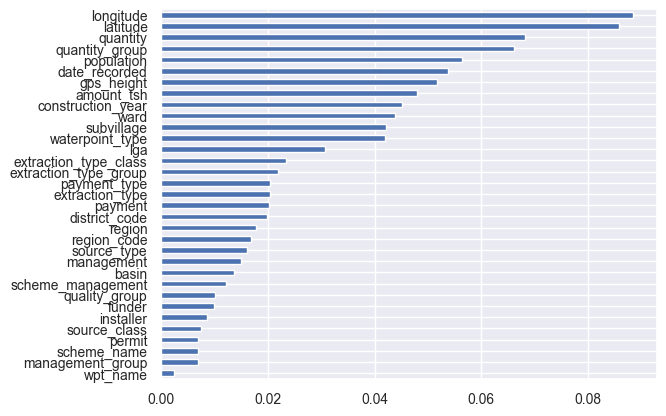

In [247]:
#variables por orden de importancia para el modelo
feat_importances = pd.Series(classifier12.feature_importances_, index=dataDep2.drop('status_group', axis=1).columns)
feat_importances.sort_values().plot(kind='barh')

In [248]:
pkl_filename = "modelo1.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(classifier12, file)

# Load from file
#with open(pkl_filename, 'rb') as file:
#    pickle_model = pickle.load(file)

# Interpretación del modelo:

De las 10 variables más importantes para el modelo, podemos interpretar que la ubicación del waterpoint juega un rol muy importante ya que las dos variables más importantes para el modelo fueron longitud y latitude, y además, ward que es una variable sobre locación, también está en el top 10 (considerando esto, también valdría explorar una posible dependencia espacial, si determinadas bombas en una locación específica son más propensas a una clase en particular). Lo segundo que más relevancia tiene es la cantidad de agua disponible en el waterpoint, ya que en el top 10 tenemos variables de quantity, quantity_group y amount_tsh. Finalmente, el año de construcción (construction_year) y la altitud del waterpoint (gps_height) definen el otro aspecto importante para la distinción de clases. 

En resumen:

Los 4 aspectos más relevantes para el modelo son: la locación del waterpoint, la cantidad de agua disponible, su año de construcción y su altitud.